<a href="https://colab.research.google.com/github/joccing/ICT303-assignment1/blob/main/HousingPricePrediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Standard Template for DNNs
by Tay Joc Cing

# Import Necessary Libraries*

In [1]:
import os
import sys
import random
import pandas as pd
import numpy as np
import torch
import importlib
import math
from pathlib import Path
import shutil

from torch import nn
from torch.nn import functional as F
from torch.utils.data import DataLoader, Dataset, Subset
from torch.utils.data import random_split, ConcatDataset
import matplotlib.pyplot as plt
import matplotlib.patches as patches

import torchvision
import torchvision.datasets as datasets
import torchvision.transforms as transforms
from torchvision.utils import make_grid

from torchvision.transforms import Resize, ToTensor
from PIL import Image

from torchsummary import summary

n_cudas = torch.cuda.device_count()
for i in range(n_cudas):
    print(f'{i+1} GPU: {torch.cuda.get_device_name(i)}')

if torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")
    print("No GPU available, using CPU.")

def install_package(package):
    try:
        importlib.import_module(package)
    except ImportError:
        import sys
        !{sys.executable} -m pip install {package}

1 GPU: Tesla T4


# Project Setup

# Reproducibility

In [3]:
import random
import numpy as np

# Set Random Seed
random_seed = 42

torch.manual_seed(random_seed)
random.seed(random_seed)
np.random.seed(random_seed)

# Project Name and Useful Functions*

In [5]:
project_name = "HousingPricePrediction"
project_name = project_name.strip().lower()

# Setup path but not mounted yet
BASE_PATH = F"/content/gdrive/My Drive/DL Course/Experiments/{project_name}/"

# Setup path but not mounted yet
IMAGE_PATH = F"/content/gdrive/My Drive/DL Course/Lesson10/images/"

# This is for TensorBoard
writer=None

try:
    import google.colab
    IS_COLAB = True
except ModuleNotFoundError:
    IS_COLAB = False

## Useful functions
def get_model_path(filename):
      full_path = F"{BASE_PATH}{filename}"
      return full_path

def is_list_of_type(lst,type=float):
  return all(isinstance(item, type) for item in lst)

# Mount Local GDrive

In [6]:
if IS_COLAB:
  from google.colab import drive
  drive.mount('/content/gdrive')

Mounted at /content/gdrive


# Visualization Tools

## Setup TensorBoard


In [ ]:
from torch.utils.tensorboard import SummaryWriter
import time

# default `log_dir` is "runs"
if 'MODEL_PATH' not in globals():
  if IS_COLAB:
    from google.colab import drive
    drive.mount('/content/gdrive')
    MODEL_PATH = get_model_path("model.pth")

TENSORB_PATH=BASE_PATH + 'tensorboard/'
print(TENSORB_PATH)

if 'TENSORB_LOADED' not in globals():
  %rm -rf "{TENSORB_PATH}"
  %load_ext tensorboard
  %tensorboard --logdir="{TENSORB_PATH}" --port=6007  # avoid using !tensorboard
  TENSORB_LOADED=True
  timestamp = str(int(time.time()))
else:
  %reload_ext tensorboard

## Setup TorchViz

In [ ]:
if IS_COLAB:
        print('Installing torchviz...')
        import subprocess
        subprocess.run([sys.executable, '-m', 'pip', 'install', 'torchviz'])
        from torchviz import make_dot
        print('installed.')

Installing torchviz...


## Useful Functions with Matplotlib*

In [ ]:
# Plot multiple curves on the same graph using a log10 scale on y-axis
def plot_curves( stats_dict, xlabel, ylabel, scale='log', title=None, exclude=[] ):

  # Plot losses
  plt.figure(figsize=(10,8))
  for (key, data) in stats_dict.items():
    if key not in exclude:
      if torch.is_tensor(data):
          data_np = data.numpy()
      elif is_list_of_type(data,float) or is_list_of_type(data,int):
          data_np = np.array(data)
      else:
        raise TypeError("Unable plot input data type.")

      # Using a log scale on y-axis by default
      if scale == 'log':
        plt.semilogy(data_np, label=key)
      else:
        plt.plot(data_np, label=key)

  plt.xlabel(xlabel)
  plt.ylabel(ylabel)
  plt.legend()
  if title:
    plt.title(title)
  plt.show()

### Test

In [ ]:
stats_dict = {'Training': [1.2,3.4,5.],
              'Validation': [2.2,3.4,4.5]}
plot_curves(stats_dict, xlabel='Epoch', ylabel='Loss')

## Visualizing Images*

In [ ]:
def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

def show_images(image_list, num_rows, num_cols, scale=1):
    num_images = min(len(image_list), num_rows * num_cols)

    # Calculate the number of rows needed
    num_rows_needed = math.ceil(num_images / num_cols)

    fig, axs = plt.subplots(num_rows_needed,
                            num_cols,
                            figsize=(24*scale, 8*scale))

    # Handle the case where we have more than one row of subplots
    if axs.ndim > 1:
        axs = axs.ravel()

    for i in range(num_rows_needed * num_cols):
        if i < num_images:
            img = image_list[i]  # Already a PIL Image object
            img_array = np.array(img)  # Convert the image to a numpy array
            axs[i].imshow(img_array)
        else:
            fig.delaxes(axs[i])  # Remove the axes for the extra subplots
        axs[i].axis('off')  # to hide the axis

    plt.subplots_adjust(wspace=0.1, hspace=0.1)  # Adjust the space between images
    plt.show()

## Let's see some images
def imshow(img, one_channel=False):
    if one_channel:
        img = img.mean(dim=0)
    npimg = img.numpy()       # convert pytorch tensor to numpy
    if one_channel:
        plt.imshow(npimg, cmap="Greys")
    else:
        plt.imshow(np.transpose(npimg, (1, 2, 0))) # matplotlib's imshow needs the numpy image to be in (height,width,channels)
    plt.show()

## Compute Image Mean and Standard Deviation*

In [ ]:
def ComputeImageDatasetStats(image_dir):

  transform = transforms.Compose([transforms.ToTensor()])
  # ImageFolder expects a certain directory structure where each class
  # corresponds to one folder, and all the images belonging to that class
  # reside within that folder. So, within your train directory, there should
  # be separate directories for each class, each containing the corresponding
  # images.
  dataset = datasets.ImageFolder(root=image_dir, transform=transform)
  dataloader = torch.utils.data.DataLoader(dataset, batch_size=1, shuffle=False)

  mean = 0.0
  for images, _ in dataloader:
      batch_samples = images.size(0)
      images = images.view(batch_samples, images.size(1), -1)

      # calculates the mean along the 2nd dimension of your images tensor.
      # In the context of image data, tensors are usually in the shape
      # (Batch size, Channels, Height, Width), so this operation computes
      # the mean of every channel in each image in the batch.
      # sum(0) part sums up the calculated means along the 0th dimension
      # (i.e., adds up the means of all images in the batch).
      mean += images.mean(2).sum(0)
  mean = mean / len(dataloader.dataset)

  var = 0.0
  total_elements = 0
  for images, _ in dataloader:
      batch_samples = images.size(0)
      images = images.view(batch_samples, images.size(1), -1)
      # The unsqueeze operation is adding an extra dimension at the
      # 1st index of the tensor mean. This operation is performed to make
      # the mean tensor align correctly with the images tensor for the
      # upcoming subtraction operation.
      # The sum([0,2]) operation sums up the values along the 0th and
      # 2nd dimensions of the tensor. For an image tensor with shape
      # (Batch size, Channels, Height, Width), this means it's adding up the
      # squared differences for each image in the batch and for each pixel
      # in each channel.
      total_elements += images.numel()/images.size(1)  # Calculate total pixel count
      var += ((images - mean.unsqueeze(1))**2).sum([0,2])
  std = torch.sqrt(var / total_elements)

  return mean, std

# Data Preparation

## Useful classes and functions*

In [6]:
# We want both tabular data and image data to be
# consistently represented in the Dataset type.
class TabularDataset(Dataset):
    def __init__(self, X, y=None):
        self.X = X
        self.y = y

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        if self.y is None:  # For test set, there are no labels
            return self.X[idx]
        else:
            return self.X[idx], self.y[idx]

# Load torchvision datasets like CIFAR10 and MNIST
def load_data(data,
              is_train,
              dataset_path="./data",
              augs=None,
              resize=(28,28),
              channel_mean=None,
              channel_stdd=None,
              redownload=False):

    if redownload and os.path.exists(dataset_path):
        shutil.rmtree(dataset_path)

    # Normalization step in image processing for neural networks is
    # usually performed after an image has been converted into a tensor
    # using transforms.ToTensor(). This converts the image from a PIL Image or
    # numpy array with dimensions (Height, Width, Channels) and pixel
    # range [0, 255] to a float tensor with dimensions (Channels, Height, Width)
    # and pixel values scaled down to the range [0.0, 1.0].
    if channel_mean and channel_stdd:
      base_transform = transforms.Compose([
          # Convert to tensor
          transforms.ToTensor(),  # data scaled to 0 to 1
          # Normalize (example values for normalization, should be adjusted based on dataset)
          transforms.Normalize(channel_mean, channel_stdd) # rescaled to -1 to 1
        ])
    else:
      base_transform = transforms.Compose([
          transforms.ToTensor(),
      ])

    if augs:
      transform = transforms.Compose([
          # Augmentations
          *augs.transforms,
          # Preprocessing
          *base_transform.transforms,
        ])
    else:
      transform = base_transform

    trainset = data(root=dataset_path,
                train=is_train,
                transform=transform,
                download=True)

    return trainset

# For visualizing images
def unnormalize(img):
    img = img / 2 + 0.5     # unnormalize
    return img

## Object Detection

### Utilities

In [ ]:
# For objection detection
def box_corner_to_center(boxes):
    """Convert from (upper-left, lower-right) to (center, width, height)."""
    x1, y1, x2, y2 = boxes[:, 0], boxes[:, 1], boxes[:, 2], boxes[:, 3]
    cx = (x1 + x2) / 2
    cy = (y1 + y2) / 2
    w = x2 - x1
    h = y2 - y1
    boxes = torch.stack((cx, cy, w, h), axis=-1)
    return boxes

def box_center_to_corner(boxes):
    """Convert from (center, width, height) to (upper-left, lower-right)."""
    cx, cy, w, h = boxes[:, 0], boxes[:, 1], boxes[:, 2], boxes[:, 3]
    x1 = cx - 0.5 * w
    y1 = cy - 0.5 * h
    x2 = cx + 0.5 * w
    y2 = cy + 0.5 * h
    boxes = torch.stack((x1, y1, x2, y2), axis=-1)
    return boxes

dog_bbox, cat_bbox = [60.0, 45.0, 378.0, 516.0], [400.0, 112.0, 655.0, 493.0]
boxes = torch.tensor((dog_bbox, cat_bbox))
box_center_to_corner(box_corner_to_center(boxes)) == boxes

tensor([[True, True, True, True],
        [True, True, True, True]])

### Detecting Multiple Bounding Boxes

In [ ]:
def multibox_prior(data, sizes, ratios):
    """Generate anchor boxes with different shapes centered on each pixel."""
    in_height, in_width = data.shape[-2:]
    device, num_sizes, num_ratios = data.device, len(sizes), len(ratios)
    boxes_per_pixel = (num_sizes + num_ratios - 1)
    size_tensor = torch.tensor(sizes, device=device)
    ratio_tensor = torch.tensor(ratios, device=device)
    # Offsets are required to move the anchor to the center of a pixel. Since
    # a pixel has height=1 and width=1, we choose to offset our centers by 0.5
    offset_h, offset_w = 0.5, 0.5
    steps_h = 1.0 / in_height  # Scaled steps in y axis
    steps_w = 1.0 / in_width  # Scaled steps in x axis

    # Generate all center points for the anchor boxes
    center_h = (torch.arange(in_height, device=device) + offset_h) * steps_h
    center_w = (torch.arange(in_width, device=device) + offset_w) * steps_w
    shift_y, shift_x = torch.meshgrid(center_h, center_w, indexing='ij')
    shift_y, shift_x = shift_y.reshape(-1), shift_x.reshape(-1)

    # Generate `boxes_per_pixel` number of heights and widths that are later
    # used to create anchor box corner coordinates (xmin, xmax, ymin, ymax)
    w = torch.cat((size_tensor * torch.sqrt(ratio_tensor[0]),
                   sizes[0] * torch.sqrt(ratio_tensor[1:])))\
                   * in_height / in_width  # Handle rectangular inputs
    h = torch.cat((size_tensor / torch.sqrt(ratio_tensor[0]),
                   sizes[0] / torch.sqrt(ratio_tensor[1:])))
    # Divide by 2 to get half height and half width
    anchor_manipulations = torch.stack((-w, -h, w, h)).T.repeat(
                                        in_height * in_width, 1) / 2

    # Each center point will have `boxes_per_pixel` number of anchor boxes, so
    # generate a grid of all anchor box centers with `boxes_per_pixel` repeats
    out_grid = torch.stack([shift_x, shift_y, shift_x, shift_y],
                dim=1).repeat_interleave(boxes_per_pixel, dim=0)
    output = out_grid + anchor_manipulations
    return output.unsqueeze(0)

### Show Multiple Bounding Boxes

In [ ]:
def show_bboxes(axes, bboxes, labels=None, colors=None):
    """Show bounding boxes."""

    def make_list(obj, default_values=None):
        if obj is None:
            obj = default_values
        elif not isinstance(obj, (list, tuple)):
            obj = [obj]
        return obj

    def bbox_to_rect(bbox, color):
        """Convert bounding box to matplotlib format."""
        # Convert the bounding box (upper-left x, upper-left y, lower-right x,
        # lower-right y) format to matplotlib format: ((upper-left x,
        # upper-left y), width, height)
        return patches.Rectangle(
            xy=(bbox[0], bbox[1]), width=bbox[2]-bbox[0], height=bbox[3]-bbox[1],
            fill=False, edgecolor=color, linewidth=2)

    labels = make_list(labels)
    colors = make_list(colors, ['b', 'g', 'r', 'm', 'c'])
    for i, bbox in enumerate(bboxes):
        color = colors[i % len(colors)]
        rect = bbox_to_rect(bbox.detach().numpy(), color)
        axes.add_patch(rect)
        if labels and len(labels) > i:
            text_color = 'k' if color == 'w' else 'w'
            axes.text(rect.xy[0], rect.xy[1], labels[i],
                      va='center', ha='center', fontsize=9, color=text_color,
                      bbox=dict(facecolor=color, lw=0))

### Calculating the Jaccard Index (IoU)

In [ ]:
def box_iou(boxes1, boxes2):
    """Compute pairwise IoU across two lists of anchor or bounding boxes."""
    box_area = lambda boxes: ((boxes[:, 2] - boxes[:, 0]) *
                              (boxes[:, 3] - boxes[:, 1]))
    # Shape of `boxes1`, `boxes2`, `areas1`, `areas2`: (no. of boxes1, 4),
    # (no. of boxes2, 4), (no. of boxes1,), (no. of boxes2,)
    areas1 = box_area(boxes1)
    areas2 = box_area(boxes2)
    # Shape of `inter_upperlefts`, `inter_lowerrights`, `inters`: (no. of
    # boxes1, no. of boxes2, 2)
    inter_upperlefts = torch.max(boxes1[:, None, :2], boxes2[:, :2])
    inter_lowerrights = torch.min(boxes1[:, None, 2:], boxes2[:, 2:])
    inters = (inter_lowerrights - inter_upperlefts).clamp(min=0)
    # Shape of `inter_areas` and `union_areas`: (no. of boxes1, no. of boxes2)
    inter_areas = inters[:, :, 0] * inters[:, :, 1]
    union_areas = areas1[:, None] + areas2 - inter_areas
    return inter_areas / union_areas

### Assigning Anchor Boxes to Bounding Boxes

In [ ]:
def assign_anchor_to_bbox(ground_truth, anchors, device, iou_threshold=0.5):
    """Assign closest ground-truth bounding boxes to anchor boxes."""
    num_anchors, num_gt_boxes = anchors.shape[0], ground_truth.shape[0]
    # Element x_ij in the i-th row and j-th column is the IoU of the anchor
    # box i and the ground-truth bounding box j
    jaccard = box_iou(anchors, ground_truth)
    # Initialize the tensor to hold the assigned ground-truth bounding box for
    # each anchor
    anchors_bbox_map = torch.full((num_anchors,), -1, dtype=torch.long,
                                  device=device)
    # Assign ground-truth bounding boxes according to the threshold
    max_ious, indices = torch.max(jaccard, dim=1)
    anc_i = torch.nonzero(max_ious >= iou_threshold).reshape(-1)
    box_j = indices[max_ious >= iou_threshold]
    anchors_bbox_map[anc_i] = box_j
    col_discard = torch.full((num_anchors,), -1)
    row_discard = torch.full((num_gt_boxes,), -1)
    for _ in range(num_gt_boxes):
        max_idx = torch.argmax(jaccard)  # Find the largest IoU
        box_idx = (max_idx % num_gt_boxes).long()
        anc_idx = (max_idx / num_gt_boxes).long()
        anchors_bbox_map[anc_idx] = box_idx
        jaccard[:, box_idx] = col_discard
        jaccard[anc_idx, :] = row_discard
    return anchors_bbox_map

### Define the offset of a bounding box given anchor

In [ ]:
def offset_boxes(anchors, assigned_bb, eps=1e-6):
    """Transform for anchor box offsets."""
    c_anc = box_corner_to_center(anchors)
    c_assigned_bb = box_corner_to_center(assigned_bb)
    offset_xy = 10 * (c_assigned_bb[:, :2] - c_anc[:, :2]) / c_anc[:, 2:]
    offset_wh = 5 * torch.log(eps + c_assigned_bb[:, 2:] / c_anc[:, 2:])
    offset = torch.cat([offset_xy, offset_wh], axis=1)
    return offset

### Labeling the anchor boxes with ground truth classes and offsets

We implement the following multibox_target function to label classes and offsets for anchor boxes (the anchors argument) using ground-truth bounding boxes (the labels argument). This function sets the background class to zero and increments the integer index of a new class by one.

In [ ]:
def multibox_target(anchors, labels):
    """Label anchor boxes using ground-truth bounding boxes."""
    batch_size, anchors = labels.shape[0], anchors.squeeze(0)
    batch_offset, batch_mask, batch_class_labels = [], [], []
    device, num_anchors = anchors.device, anchors.shape[0]
    for i in range(batch_size):
        label = labels[i, :, :]
        anchors_bbox_map = assign_anchor_to_bbox(
            label[:, 1:], anchors, device)
        bbox_mask = ((anchors_bbox_map >= 0).float().unsqueeze(-1)).repeat(
            1, 4)
        # Initialize class labels and assigned bounding box coordinates with
        # zeros
        class_labels = torch.zeros(num_anchors, dtype=torch.long,
                                   device=device)
        assigned_bb = torch.zeros((num_anchors, 4), dtype=torch.float32,
                                  device=device)
        # Label classes of anchor boxes using their assigned ground-truth
        # bounding boxes. If an anchor box is not assigned any, we label its
        # class as background (the value remains zero)
        indices_true = torch.nonzero(anchors_bbox_map >= 0)
        bb_idx = anchors_bbox_map[indices_true]
        class_labels[indices_true] = label[bb_idx, 0].long() + 1
        assigned_bb[indices_true] = label[bb_idx, 1:]
        # Offset transformation
        offset = offset_boxes(anchors, assigned_bb) * bbox_mask
        batch_offset.append(offset.reshape(-1))
        batch_mask.append(bbox_mask.reshape(-1))
        batch_class_labels.append(class_labels)
    bbox_offset = torch.stack(batch_offset)
    bbox_mask = torch.stack(batch_mask)
    class_labels = torch.stack(batch_class_labels)
    return (bbox_offset, bbox_mask, class_labels)

### Getting the predicted Bbox from Anchors

When there are many anchor boxes, many similar (with significant overlap) predicted bounding boxes can be potentially output for surrounding the same object. To simplify the output, we can merge similar predicted bounding boxes that belong to the same object by using non-maximum suppression (NMS).

In [ ]:
def offset_inverse(anchors, offset_preds):
    """Predict bounding boxes based on anchor boxes with predicted offsets."""
    anc = box_corner_to_center(anchors)
    pred_bbox_xy = (offset_preds[:, :2] * anc[:, 2:] / 10) + anc[:, :2]
    pred_bbox_wh = torch.exp(offset_preds[:, 2:] / 5) * anc[:, 2:]
    pred_bbox = torch.cat((pred_bbox_xy, pred_bbox_wh), axis=1)
    predicted_bbox = box_center_to_corner(pred_bbox)
    return predicted_bbox

### Non-max Suppresion

In [ ]:
def nms(boxes, scores, iou_threshold):
    """Sort confidence scores of predicted bounding boxes."""
    B = torch.argsort(scores, dim=-1, descending=True)
    keep = []  # Indices of predicted bounding boxes that will be kept
    while B.numel() > 0:
        i = B[0]
        keep.append(i)
        if B.numel() == 1: break
        iou = box_iou(boxes[i, :].reshape(-1, 4),
                      boxes[B[1:], :].reshape(-1, 4)).reshape(-1)
        inds = torch.nonzero(iou <= iou_threshold).reshape(-1)
        B = B[inds + 1]
    return torch.tensor(keep, device=boxes.device)

### Apply NMS to predicting BBoxes

define the following multibox_detection to apply non-maximum suppression to predicting bounding boxes.

In [ ]:
def multibox_detection(cls_probs, offset_preds, anchors, nms_threshold=0.5,
                       pos_threshold=0.009999999):
    """Predict bounding boxes using non-maximum suppression."""
    device, batch_size = cls_probs.device, cls_probs.shape[0]
    anchors = anchors.squeeze(0)
    num_classes, num_anchors = cls_probs.shape[1], cls_probs.shape[2]
    out = []
    for i in range(batch_size):

        cls_prob, offset_pred = cls_probs[i], offset_preds[i].reshape(-1, 4)
        conf, class_id = torch.max(cls_prob[1:], 0)
        predicted_bb = offset_inverse(anchors, offset_pred)

        # Apply NMS
        keep = nms(predicted_bb, conf, nms_threshold)

        # Find all non-`keep` indices and set the class to background
        all_idx = torch.arange(num_anchors, dtype=torch.long, device=device)
        combined = torch.cat((keep, all_idx))
        uniques, counts = combined.unique(return_counts=True)
        non_keep = uniques[counts == 1]
        all_id_sorted = torch.cat((keep, non_keep))
        class_id[non_keep] = -1
        class_id = class_id[all_id_sorted]
        conf, predicted_bb = conf[all_id_sorted], predicted_bb[all_id_sorted]

        # Here `pos_threshold` is a threshold for positive (non-background)
        # predictions
        below_min_idx = (conf < pos_threshold)
        class_id[below_min_idx] = -1
        conf[below_min_idx] = 1 - conf[below_min_idx]
        pred_info = torch.cat((class_id.unsqueeze(1),
                               conf.unsqueeze(1),
                               predicted_bb), dim=1)
        out.append(pred_info)
    return torch.stack(out)

### For multi-scale anchors using feature maps

In [ ]:
def display_anchors(image, fmap_w, fmap_h, s):
    # Values on the first two dimensions do not affect the output
    fmap = torch.zeros((1, 10, fmap_h, fmap_w))
    anchors = multibox_prior(fmap, sizes=s, ratios=[1, 2, 0.5])
    bbox_scale = torch.tensor((w, h, w, h))
    show_bboxes(plt.imshow(image).axes,
                    anchors[0] * bbox_scale)

#### Test Object Detection

In [ ]:
if IS_COLAB:
  from google.colab import drive
  drive.mount('/content/gdrive')

# Setup path but not mounted yet
#IMAGE_PATH = F"/content/gdrive/My Drive/DL Course/Lesson10/images/"

my_file = Path(IMAGE_PATH + 'cat_dog.jpg')
if my_file.is_file():
    # file exists
    image = Image.open(my_file)
else:
    raise FileNotFoundError(f'Missing: {my_file}')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


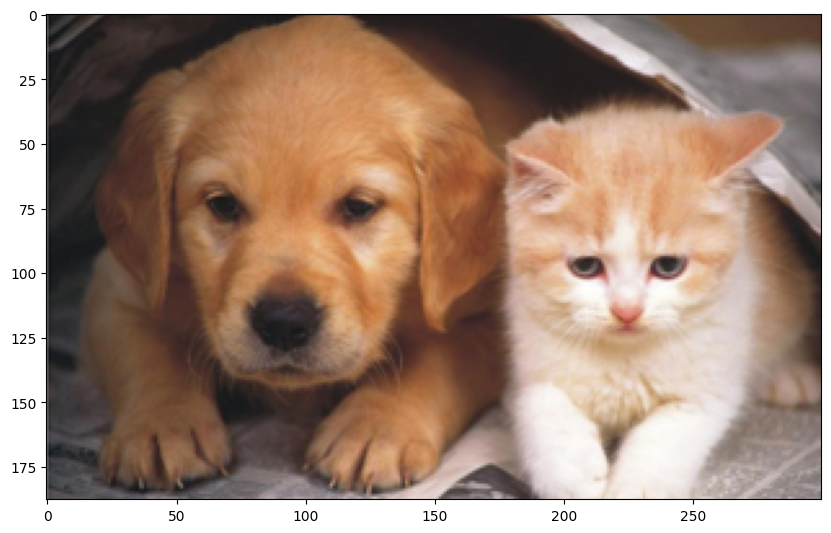

h188 x w300


In [ ]:
# Set the figure size
plt.figure(figsize=(10,10))

# Resize the image
max_size = (300, 300)  # replace with the size you want
image.thumbnail(max_size)

# # If processing is needed
# # transform to image tensor and then transform back
# transform = transforms.ToTensor()
# image = transform(image)

# # from torchvision.transforms.functional import to_pil_image
# # image = to_pil_image(image)
# # Display the image
plt.imshow(image)
plt.show()

# Print size
print(f'h{image.height} x w{image.width}')

In [ ]:
# Creating the bounding boxes
h = image.height
w = image.width

X = torch.rand(size=(1, 3, h, w))  # Construct input data
Y = multibox_prior(X, sizes=[0.75, 0.5, 0.25], ratios=[1, 2, 0.5])
Y.shape

torch.Size([1, 282000, 4])

In [ ]:
# reshape so that there is 5 bounding boxes per pixel
boxes = Y.reshape(h, w, 5, 4)
boxes[150, 150, 0, :] # bounding box coordinates at (150,150)

tensor([0.2667, 0.4255, 0.7367, 1.1755])

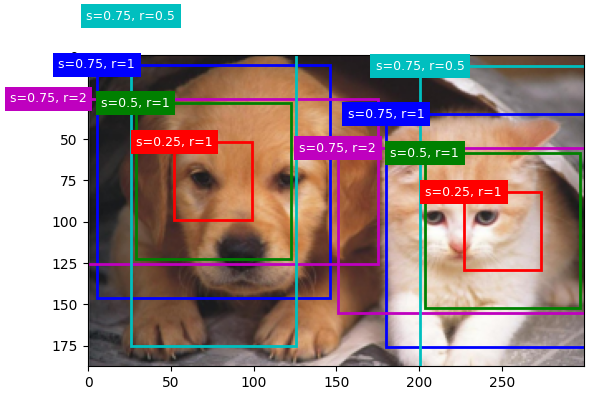

In [ ]:
bbox_scale = torch.tensor((w, h, w, h))
fig = plt.imshow(image)
show_bboxes(fig.axes, boxes[75, 75, :, :] * bbox_scale,
            ['s=0.75, r=1', 's=0.5, r=1', 's=0.25, r=1', 's=0.75, r=2',
             's=0.75, r=0.5'])
show_bboxes(fig.axes, boxes[105, 250, :, :] * bbox_scale,
            ['s=0.75, r=1', 's=0.5, r=1', 's=0.25, r=1', 's=0.75, r=2',
             's=0.75, r=0.5'])

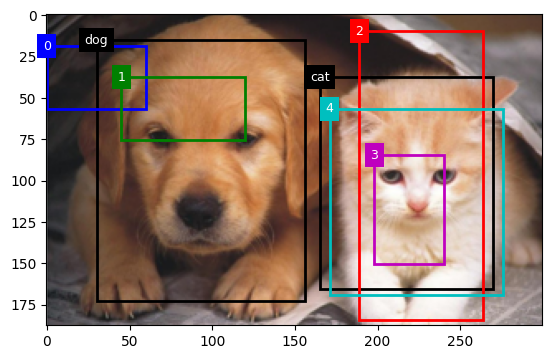

In [ ]:
ground_truth = torch.tensor([[0, 0.1, 0.08, 0.52, 0.92],
                         [1, 0.55, 0.2, 0.9, 0.88]])

# Arbitrary, not the same as above
anchors = torch.tensor([[0, 0.1, 0.2, 0.3], [0.15, 0.2, 0.4, 0.4],
                    [0.63, 0.05, 0.88, 0.98], [0.66, 0.45, 0.8, 0.8],
                    [0.57, 0.3, 0.92, 0.9]])

fig = plt.imshow(image)
show_bboxes(fig.axes, ground_truth[:, 1:] * bbox_scale, ['dog', 'cat'], 'k')
show_bboxes(fig.axes, anchors * bbox_scale, ['0', '1', '2', '3', '4']);

In [ ]:
labels = multibox_target(anchors.unsqueeze(dim=0),
                         ground_truth.unsqueeze(dim=0))
labels[2]

tensor([[0, 1, 2, 0, 2]])

In [ ]:
anchors = torch.tensor([[0.1, 0.08, 0.52, 0.92], [0.08, 0.2, 0.56, 0.95],
                      [0.15, 0.3, 0.62, 0.91], [0.55, 0.2, 0.9, 0.88]])
offset_preds = torch.tensor([0] * anchors.numel())
cls_probs = torch.tensor([[0] * 4,  # Predicted background likelihood
                      [0.9, 0.8, 0.7, 0.1],  # Predicted dog likelihood
                      [0.1, 0.2, 0.3, 0.9]])  # Predicted cat likelihood

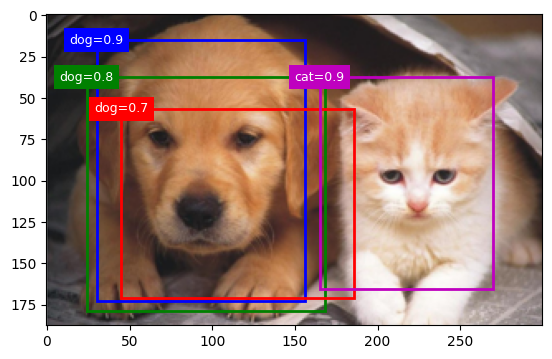

In [ ]:
fig = plt.imshow(image)
show_bboxes(fig.axes, anchors * bbox_scale,
            ['dog=0.9', 'dog=0.8', 'dog=0.7', 'cat=0.9'])

In [ ]:
output = multibox_detection(cls_probs.unsqueeze(dim=0),
                            offset_preds.unsqueeze(dim=0),
                            anchors.unsqueeze(dim=0),
                            nms_threshold=0.5)
output

tensor([[[ 0.0000,  0.9000,  0.1000,  0.0800,  0.5200,  0.9200],
         [ 1.0000,  0.9000,  0.5500,  0.2000,  0.9000,  0.8800],
         [-1.0000,  0.8000,  0.0800,  0.2000,  0.5600,  0.9500],
         [-1.0000,  0.7000,  0.1500,  0.3000,  0.6200,  0.9100]]])

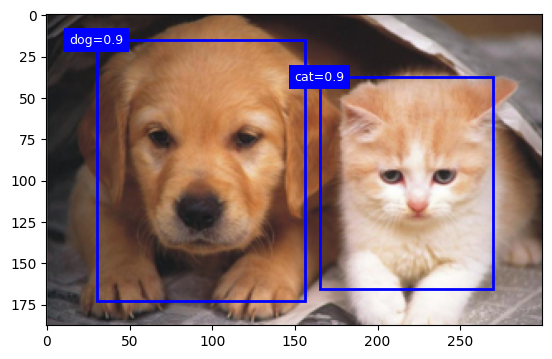

In [ ]:
fig = plt.imshow(image)
for i in output[0].detach().numpy():
    if i[0] == -1:
        continue
    label = ('dog=', 'cat=')[int(i[0])] + str(i[1])
    show_bboxes(fig.axes, [torch.tensor(i[2:]) * bbox_scale], label)

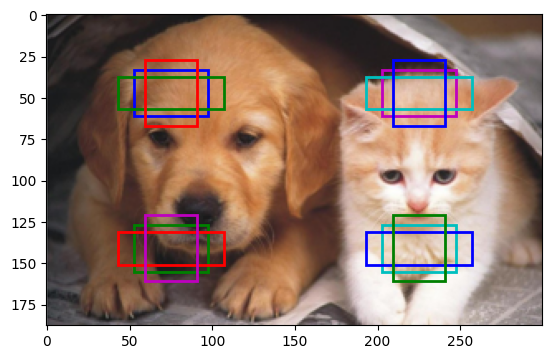

In [ ]:
# We move on to reduce the height and width of the feature map by half and
# use larger anchor boxes to detect larger objects. When the scale
# is set to 0.4, some anchor boxes will overlap with each other.
display_anchors(image, fmap_w=2, fmap_h=2, s=[0.15])

## Download Kaggle Housing Price Data

In [7]:
def is_running_in_colab():
    try:
        from google.colab import _ipython as ip
        return True
    except ImportError:
        return False

def is_running_in_jupyter():
    try:
        shell = get_ipython().__class__.__name__
        if shell == 'ZMQInteractiveShell':
            return True
        else:
            return False
    except NameError:
        return False

def is_running_in_vscode():
    return 'VSCODE_PID' in os.environ

try:
  if is_running_in_colab():
    print("Running in Google Colab")
  elif is_running_in_jupyter():
    if is_running_in_vscode():
      print("Running in Jupyter Notebook within VSCode")
    else:
      print("Running in Jupyter Notebook (not in VSCode)")

  import requests
  url = 'https://raw.githubusercontent.com/joccing/ICT303-assignment1/master/config.py'
  r = requests.get(url, allow_redirects=True)
  open('config.py', 'wb').write(r.content)

except ModuleNotFoundError:
  pass

from config import *
config_data()

Running in Google Colab
Finished!


In [8]:
try:
    import pandas as pd
except ImportError:
    # If pandas is not installed, install it
    install_package('pandas')
    import pandas as pd

train_data = pd.read_csv('data/train.csv')
test_data  = pd.read_csv('data/test.csv')
assert train_data.shape == (1460,81)
assert test_data.shape == (1459, 80)
print('Loaded and verified data!')

Loaded and verified data!


### Visualize Housing Price Data

<ipython-input-9-6181a34aedfd>:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data['SalePrice'], fit=norm, ax=ax1)
<ipython-input-9-6181a34aedfd>:14: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(np.log(data['SalePrice'] + 1), fit=norm, ax=ax2)


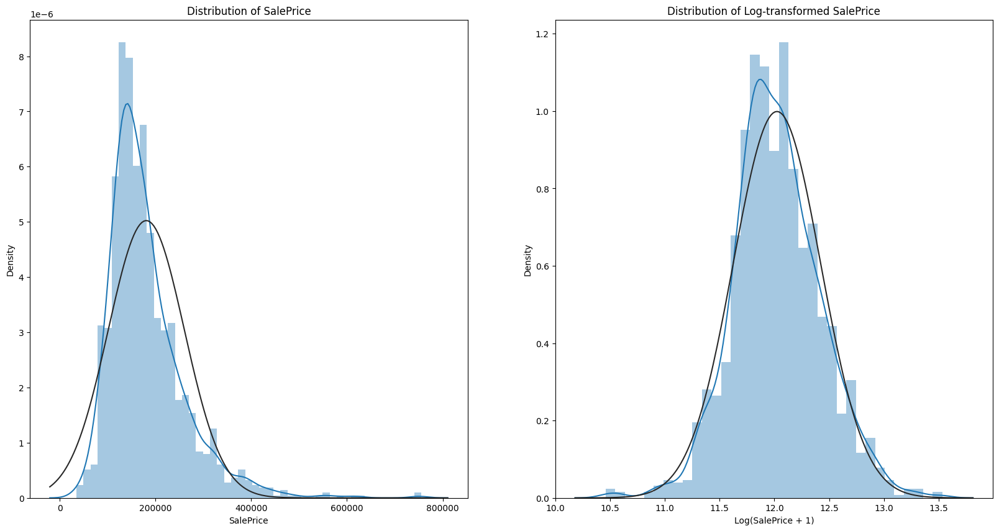

In [9]:
import seaborn as sns
from scipy.stats import norm

data = train_data

# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

# Plot the distribution of SalePrice in the first subplot
sns.distplot(data['SalePrice'], fit=norm, ax=ax1)
# sns.displot(train_data['SalePrice'],kde=True,ax=ax1)

# Plot the distribution of log-transformed SalePrice in the second subplot
# Normalization: In some cases, data may not follow a normal distribution or have a skewed distribution.
# Taking the logarithm of the data can help transform it into a more symmetric or normally distributed form.
# This can be useful for applying statistical tests or models that assume normality.
sns.distplot(np.log(data['SalePrice'] + 1), fit=norm, ax=ax2)
+# sns.displot(np.log(train_data['SalePrice'] + 1), kde=True,ax=ax2)

# Set labels and titles for the subplots
ax1.set_xlabel('SalePrice')
ax1.set_ylabel('Density')
ax1.set_title('Distribution of SalePrice')

ax2.set_xlabel('Log(SalePrice + 1)')
ax2.set_ylabel('Density')
ax2.set_title('Distribution of Log-transformed SalePrice')

# Display the figure
plt.show()

In [ ]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

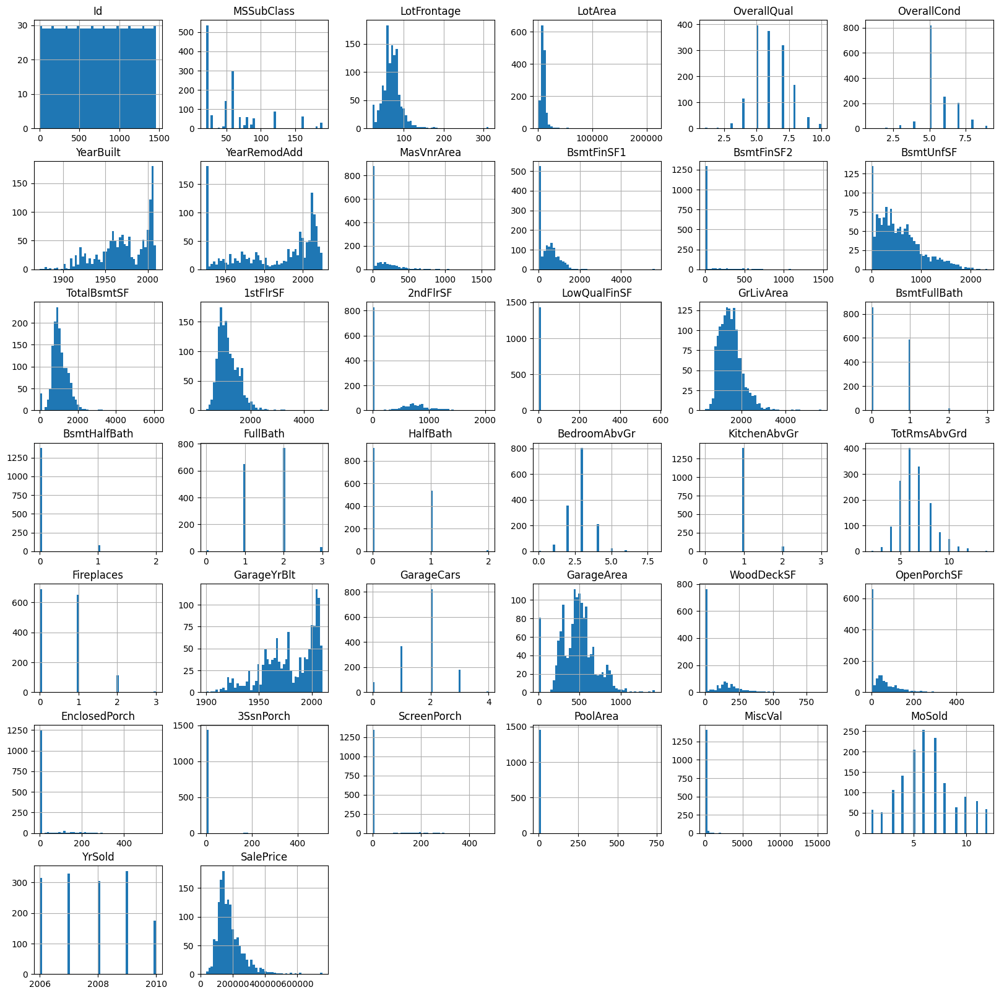

In [ ]:
train_data.hist(bins=50, figsize=(20,20))
plt.show()

<ipython-input-24-e747a278e00c>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = data.corr()


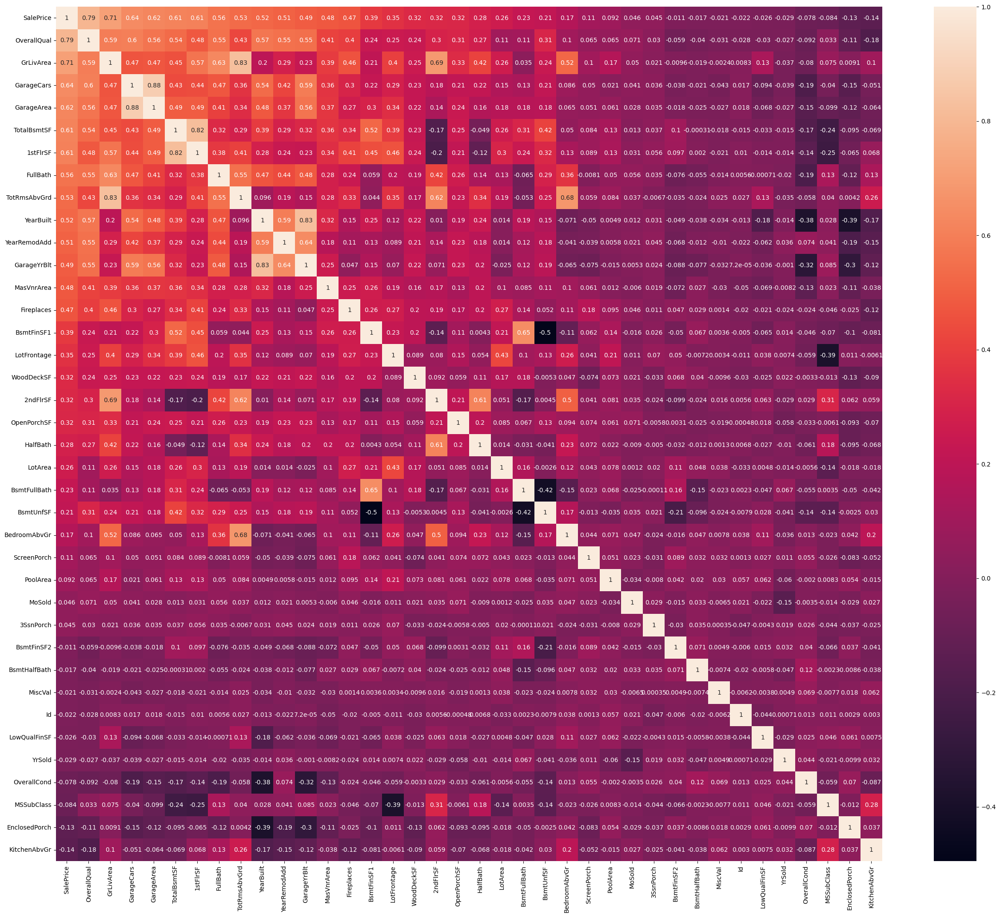

In [ ]:
# Calculate the correlation matrix
corr = data.corr()

# Select the top correlated features with 'SalePrice'
top_corr = data[corr.nlargest(40, 'SalePrice')['SalePrice'].index].corr()

# Create a figure and axes for the heatmap
figure, ax1 = plt.subplots(nrows=1, ncols=1)
figure.set_size_inches(30, 25)

# Plot the correlation heatmap
sns.heatmap(top_corr, annot=True, ax=ax1)

# Display the heatmap
plt.show()

In [ ]:
corr['SalePrice'].sort_values(ascending=False)

SalePrice        1.000000
OverallQual      0.790982
GrLivArea        0.708624
GarageCars       0.640409
GarageArea       0.623431
TotalBsmtSF      0.613581
1stFlrSF         0.605852
FullBath         0.560664
TotRmsAbvGrd     0.533723
YearBuilt        0.522897
YearRemodAdd     0.507101
GarageYrBlt      0.486362
MasVnrArea       0.477493
Fireplaces       0.466929
BsmtFinSF1       0.386420
LotFrontage      0.351799
WoodDeckSF       0.324413
2ndFlrSF         0.319334
OpenPorchSF      0.315856
HalfBath         0.284108
LotArea          0.263843
BsmtFullBath     0.227122
BsmtUnfSF        0.214479
BedroomAbvGr     0.168213
ScreenPorch      0.111447
PoolArea         0.092404
MoSold           0.046432
3SsnPorch        0.044584
BsmtFinSF2      -0.011378
BsmtHalfBath    -0.016844
MiscVal         -0.021190
Id              -0.021917
LowQualFinSF    -0.025606
YrSold          -0.028923
OverallCond     -0.077856
MSSubClass      -0.084284
EnclosedPorch   -0.128578
KitchenAbvGr    -0.135907
Name: SalePr

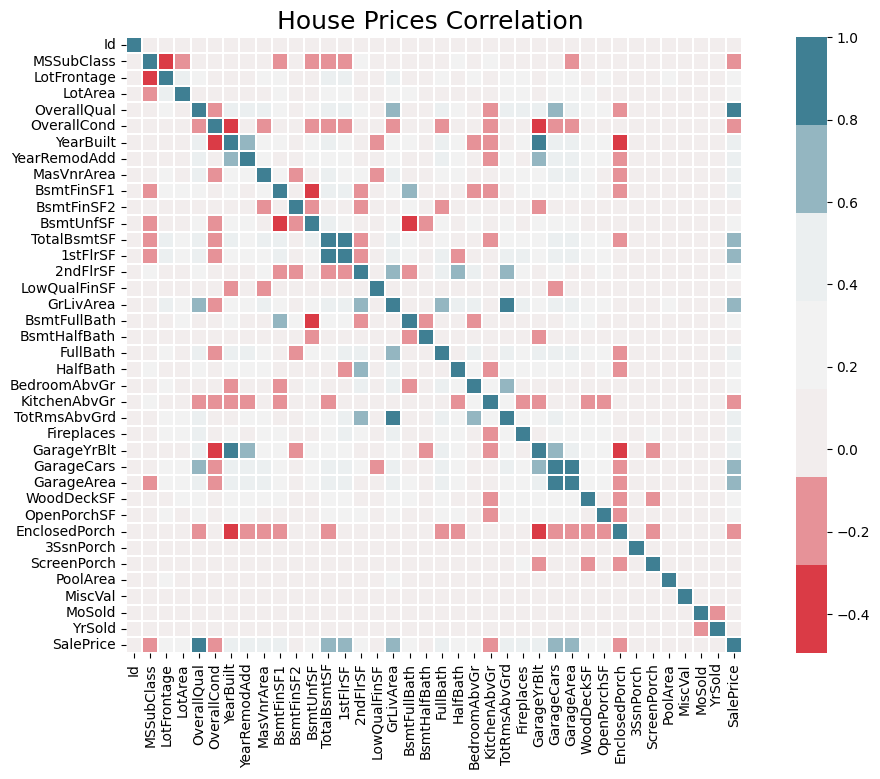

In [ ]:
plt.figure(figsize=(14,8))
plt.title('House Prices Correlation ', fontsize=18)
sns.heatmap(corr,annot=False,cmap=sns.diverging_palette(10, 220, sep=80, n=7),linewidths=0.2, square=True)
plt.show()

### Data Cleaning

<Axes: xlabel='GrLivArea', ylabel='SalePrice'>

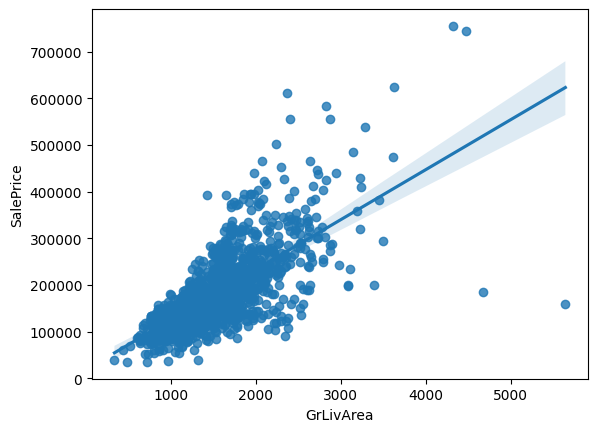

In [ ]:
sns.regplot(x=data['GrLivArea'], y=data['SalePrice'])

The graph of GrLivArea, which has the second largest correlation coefficient, is shown above.

 Overall, it can be seen that as the "GrLivArea" increases, the housing price also increases. However, one of the ways to increase the accuracy of machine learning is to consider two dots on the right and delete such data as "outliers."

In [ ]:
# Filter out rows where 'GrLivArea' is greater than 4000 and 'SalePrice' is less than 300000
condition = (train_data['GrLivArea'] > 4000) & (train_data['SalePrice'] < 300000)
train_data = train_data.drop(train_data[condition].index)

In [ ]:
# Extract the 'SalePrice' column from the 'train' DataFrame and assign it to 'Y_train'
y_train = train_data['SalePrice']

# Select only the columns present in the 'test' DataFrame in the 'train' DataFrame
train_test_data = train_data.loc[:, list(test_data.columns)]

# Concatenate the 'train' and 'test' DataFrames along the row axis
total_data = pd.concat([train_test_data, test_data], axis=0)

# Print the shape of the concatenated DataFrame
print(total_data.shape)

# Apply a natural logarithm transformation to 'y_train'
y_train = np.log1p(y_train)

(2917, 80)


'data description.txt' file that comes with the data download, it says that if there is no facility at home, it is treated as a missing value.
There may be real missing spots in the middle, but there are more cases where there are none. Therefore, the method of processing missing values may be simple.

In [ ]:
# Create a list of all column names in 'total_data'
cols = list(total_data.columns)

# Create an empty list to store columns with missing values
cols_with_missing = []

# Iterate through the columns in 'total_data'
for col in cols:
    # Check if the column has any missing values
    if total_data[col].isnull().sum() > 0:
        # Add the column to the 'cols_with_missing' list
        cols_with_missing.append(col)

# Calculate the number of columns with missing values
num_cols_with_missing = len(cols_with_missing)

# Print the number of columns with missing values
print(num_cols_with_missing)

34


First, if there is no facility in the house (categorical variable), fill the missing value with the string 'None'. This unquoted text "None" is different from the string "None"

Second, if there is no facility in the house (a numerical variable), fill the missing value with zero. If the area of the garage is = 0, there is no garage, which can be considered like this.

Third, the missing value in the case where it is difficult to see that the facility is not there, in this case, the missing value is filled with the lowest value of the column. There is no way that there is no outer wall facility in the house, and the transaction type is not decided when the house is sold.

In [ ]:
# Columns with categorical variables to fill with 'None'
categorical_cols = ('PoolQC', 'MiscFeature', 'Alley', 'Fence', 'FireplaceQu', 'GarageType', 'GarageFinish',
                    'GarageQual', 'GarageCond', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1',
                    'BsmtFinType2', 'MasVnrType', 'MSSubClass')

# Columns with numerical variables to fill with 0
numerical_cols = ('GarageYrBlt', 'GarageArea', 'GarageCars', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF',
                  'TotalBsmtSF', 'BsmtFullBath', 'BsmtHalfBath', 'MasVnrArea', 'LotFrontage')

# Columns with categorical variables to fill with mode
mode_fill_cols = ('MSZoning', 'Electrical', 'KitchenQual', 'Exterior1st', 'Exterior2nd', 'SaleType',
                  'Functional', 'Utilities')

# Fill categorical columns with 'None'
for col in categorical_cols:
    total_data[col] = total_data[col].fillna('None')

# Fill numerical columns with 0
for col in numerical_cols:
    total_data[col] = total_data[col].fillna(0)

# Fill mode-based columns with mode value
for col in mode_fill_cols:
    total_data[col] = total_data[col].fillna(total_data[col].mode()[0])

# Calculate the total count of missing values in 'total_data'
missing_values_count = total_data.isnull().sum().sum()

# Print the total count of missing values
print(f"missing value: {missing_values_count}")

missing value: 0


### Feature Engineering

Create new variables based on similar categories/names is better by using the variable names and data in the sample data.


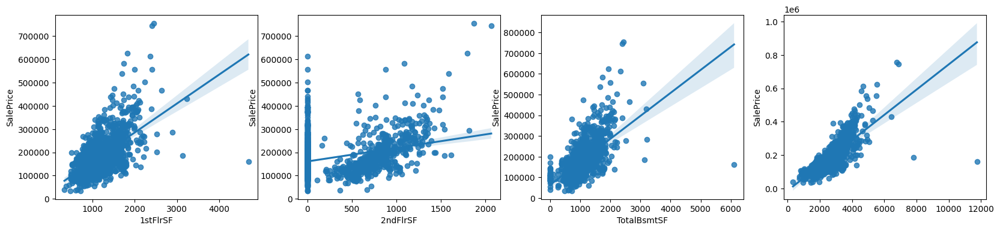

In [ ]:
# Create subplots and figure
figure, (ax1, ax2, ax3, ax4) = plt.subplots(nrows=1, ncols=4)
figure.set_size_inches(20, 4)

# Plot regression plots
sns.regplot(x=data['1stFlrSF'], y=data['SalePrice'], ax=ax1)
sns.regplot(x=data['2ndFlrSF'], y=data['SalePrice'], ax=ax2)
sns.regplot(x=data['TotalBsmtSF'], y=data['SalePrice'], ax=ax3)
sns.regplot(x=data['TotalBsmtSF'] + data['1stFlrSF'] + data['2ndFlrSF'], y=data['SalePrice'], ax=ax4)

# Adjust subplot spacing
plt.subplots_adjust(hspace=0.4)

# Show the plots
plt.show()

The above codes pass the data['1stFlrSF'], data['2ndFlrSF'], data['TotalBsmtSF'] and data['TotalBsmtSF'] + data['1stFlrSF'] + data['2ndFlrSF'] variables.

Therfore, The graph on the right represents the total area. (4th one)

As you can see from the graph, this graph can explain the target variable quite well. The correlation seems pretty high, too. It can be seen that the higher the total area, the more expensive the house price becomes. I added them and saved them under the name TotalSF.

In [ ]:
# Create a new column 'TotalSF' by summing 'TotalBsmtSF', '1stFlrSF', and '2ndFlrSF'
total_data['TotalSF'] = total_data['TotalBsmtSF'] + total_data['1stFlrSF'] + total_data['2ndFlrSF']

# Create a new column 'No2ndFlr' to indicate if '2ndFlrSF' is zero
total_data['No2ndFlr'] = (total_data['2ndFlrSF'] == 0)

# Create a new column 'NoBase' to indicate if 'TotalBsmtSF' is zero
total_data['NoBase'] = (total_data['TotalBsmtSF'] == 0)

In addition, variables called "No2ndFlr" and "NoBase" are created to indicate whether there is no second floor or no basement.

When it comes to the graph that shows the area of the second floor, the straight line shown does not seem to fit the points very well. I think that's probably because of the zeros on that graph, so if I separate these zeros, I might be able to draw a pretty straight line.

Then, next is to see the numbers of Bathroom. (Not just because of prediction but also based on common sense, the bathroom is a common feature in housing.)


In [ ]:
# Create subplots and figure for the first four plots
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(20, 10))
ax1, ax2, ax3, ax4 = axs.flatten()

# Plot bar plots for the first four features
sns.barplot(x=data['BsmtFullBath'], y=data['SalePrice'], ax=ax1)
sns.barplot(x=data['BsmtHalfBath'], y=data['SalePrice'], ax=ax2)
sns.barplot(x=data['FullBath'], y=data['SalePrice'], ax=ax3)
sns.barplot(x=data['HalfBath'], y=data['SalePrice'], ax=ax4)

# Create subplot and figure for the fifth plot
fig2, ax5 = plt.subplots(nrows=1, ncols=1, figsize=(5, 5))

# Plot the bar plot for the fifth feature
sns.barplot(x=data['BsmtFullBath'] + data['FullBath'] + (data['BsmtHalfBath'] / 2) + (data['HalfBath'] / 2), y=data['SalePrice'], ax=ax5)

# Display the plots
plt.show()

The purpose of creating the above bar plots is to visualize the relationship between various bathroom-related features (BsmtFullBath, FullBath, BsmtHalfBath, HalfBath) and the target variable (SalePrice). By creating these plots, I can gain insights into how these features may impact the sale price of houses.

The number of bathrooms consisted of "Full Bath" and "Half Bath," and whether they were underground, and a total of four rows were added to make them one. Full Bath has a bathtub and shower, and Half Bath is a simple bathroom with a toilet and a sink.

According to the data name, the above graph was obtained when FullBath was counted as 1 and HalfBath was measured as 0.5.

Further, when it comes to the last graph (size 5,5), it can be seen that the higher the number of bathrooms, the higher the house price. It can assume that the larger the house, the more bathrooms there will be.

But there's one unusual thing here: houses with five or six bathrooms don't see the black vertical line on the bar graph. The black-coloured test line means deviation; even if there are only two data with different values, there will be a deviation. However, on my graph, there is no line. Then it means there is only one house with five and six toilets each. So, It doesn't matter to judge them as outliers and erase them.

In [ ]:
# Create a new column 'TotalBath' in 'total_data'
total_data['TotalBath'] = total_data['BsmtFullBath'] + total_data['FullBath'] + (total_data['BsmtHalfBath']/2) + (total_data['HalfBath']/2)

Next, it is time to see the built years.
After reading the sample data, I see that Year Built and Remodeled data have similar distributions.
So, It might be better to add one data that includes both of these.

In [ ]:
# Create subplots and figure
fig, axs = plt.subplots(nrows=1, ncols=3)
fig.set_size_inches(15, 5)

# Plot regression plots
sns.regplot(x=data['YearRemodAdd'], y=data['SalePrice'], ax=axs[0])
sns.regplot(x=data['YearBuilt'], y=data['SalePrice'], ax=axs[1])
sns.regplot(x=(data['YearRemodAdd'] + data['YearBuilt']) / 2, y=data['SalePrice'], ax=axs[2])

# Show the plots
plt.show()

# Then save the data to a new set
total_data['RemodNdYrBuilt']=total_data['YearRemodAdd']+total_data['YearBuilt']

### Correct way to prepare data: Avoid data leakage

In [ ]:
from sklearn.model_selection import train_test_split

# Separate features and labels in the training data
X_train = train_data.iloc[:, 1:-1]
y_train = np.array(train_data.SalePrice.values).reshape((-1, 1))

# Take the log of the predicted sales prices
# Apply a natural logarithm transformation to 'Y_train'
#y_train = np.log1p(y_train)
y_train = np.log10(y_train)

# Get the test features
X_test = test_data.iloc[:, 1:]

# Normalize the numerical features in the training data
numeric_features = X_train.dtypes[X_train.dtypes != 'object'].index
mean = X_train[numeric_features].mean()
std = X_train[numeric_features].std()
X_train[numeric_features] = (X_train[numeric_features] - mean) / std

# Normalize the numerical features in the test data using training mean and std
X_test[numeric_features] = (X_test[numeric_features] - mean) / std

# Set missing values to 0
X_train = X_train.fillna(0)
X_test = X_test.fillna(0)

# One-hot encoding
X_train = pd.get_dummies(X_train, dummy_na=True)
X_test = pd.get_dummies(X_test, dummy_na=True)

# Make sure both data have the same dummies
# drop any additional columns in X_test to maintain consistency
X_train, X_test = X_train.align(X_test, join='left', axis=1)

# Fill new dummy columns with 0
X_test = X_test.fillna(0)

# Split the data
X_train, X_valid, y_train, y_valid = train_test_split(X_train.values,
                                                      y_train,
                                                      test_size=0.2,
                                                      random_state=random_seed)

# Convert to PyTorch tensors
X_train = torch.tensor(X_train, dtype=torch.float32)
X_valid = torch.tensor(X_valid, dtype=torch.float32)
y_train = torch.tensor(y_train, dtype=torch.float32)
y_valid = torch.tensor(y_valid, dtype=torch.float32)

# Create Datasets
train_dataset = TabularDataset(X_train, y_train)
val_dataset = TabularDataset(X_valid, y_valid)

# Convert test data to PyTorch tensor
X_test = torch.tensor(X_test.values, dtype=torch.float32)
test_dataset = TabularDataset(X_test)

### One-hot Encoding

In [ ]:
#non_numeric = total_data.select_dtypes(include=[np.object])

def onehot_encode(columns):
    global total_data
    for col in columns:
        data_encoded = pd.get_dummies(total_data[col], prefix=col)
        total_data = pd.concat([total_data, data_encoded], axis=1)
        total_data = total_data.drop(columns=col)
    print(total_data.shape)

#onehot_encode(list(non_numeric))



### Log transform for skewed feature data

In [ ]:
#numeric = total_data.select_dtypes(include=[np.number])

def log_transform(columns):
    transformed_cols = []
    for col in columns:
        if total_data[col].skew() > 0.5:
            total_data[col] = np.log1p(total_data[col])
            transformed_cols.append(col)
    print(f"{len(transformed_cols)} are transformed")
    print(total_data.shape)

#log_transform(list(numeric))

### Missing data in Pandas dataframe

In [ ]:
#function to see the missing data in a dataframe
def missing_data(df,n):
    total = df.isnull().sum().sort_values(ascending=False)          # Total No of missing values
    percentage = (df.isnull().sum() / df.isnull().count()).sort_values(ascending=False)*100  # % of Missing values
    No_unique_val = df.nunique()                                   # No of unique values
    missing_data = pd.concat([total, percentage, No_unique_val], axis=1,
                             keys=['Total No of missing val', '% of Missing val','No of unique val'], sort = False)

    print(missing_data.head(n))

### Incorrect way to prepare data: Data Leakage

Concatenate training and test data, avoiding the ID and Label columns

In [ ]:
all_features = pd.concat((train_data.iloc[:, 1:-1], test_data.iloc[:, 1:]))
# print(all_features.dtypes[all_features.dtypes != 'object'].index)
# all_features.shape

Do data normalization and fill NAs with 0s

In [ ]:
# Normalize the numerical features
numeric_features = all_features.dtypes[all_features.dtypes != 'object'].index
all_features[numeric_features] = all_features[numeric_features].apply(lambda x: (x - x.mean()) / (x.std()))

# Set missing values to 0
all_features = all_features.fillna(0)

Convert categorical data into one-hot encoded features

In [ ]:
# Dummy_na=True refers to a missing value being a legal eigenvalue, and creates an indicative feature for it.
all_features = pd.get_dummies(all_features, dummy_na=True)
print(f'Shape of all training data: {all_features.shape}')
print(f'Shape of non-processed training: {train_data.shape}')
print(f'Shape of non-processed test: {test_data.shape}')

Shape of all training data: (2917, 353)
Shape of non-processed training: (1458, 81)
Shape of non-processed test: (1459, 80)


Prepare for training

In [ ]:
from sklearn.model_selection import train_test_split
from torch.utils.data import TensorDataset
from torch.utils.data import ConcatDataset

# Get number of rows of training data
train_size = train_data.shape[0]

# the test feature are in all_features[n_train:].values
test_dataset  = np.array(all_features[train_size:].values)

# the train feature are in all_features[:n_train].values
X = np.array(all_features[:train_size].values)

# the train labels are in train_data.SalePrice.values - need to convert them into a pytorch tensor??
y = np.array(train_data.SalePrice.values).reshape((-1, 1))

# Split the data
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=42)

# Convert to PyTorch tensors
X_train = torch.tensor(X_train, dtype=torch.float32)
X_valid = torch.tensor(X_valid, dtype=torch.float32)
y_train = torch.tensor(y_train, dtype=torch.float32)
y_valid = torch.tensor(y_valid, dtype=torch.float32)

# Create TensorDatasets
train_dataset = TensorDataset(X_train, y_train)
val_dataset = TensorDataset(X_valid, y_valid)

# Combine train_dataset and val_dataset
trainset = ConcatDataset([train_dataset, val_dataset])

## Download and process CIFAR10 data

In [ ]:
# Define the CIFAR10 classes
classes = ('plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

# Preprocessing or Augmentations
# if images have RGB channels, then use the known mean and standard deviations
# for each channel, for eg from ImageNet
# normalize = torchvision.transforms.Normalize(
#     [0.485, 0.456, 0.406], [0.229, 0.224, 0.225])

augs = torchvision.transforms.Compose([torchvision.transforms.Resize((28,28))])
trainset = load_data(torchvision.datasets.CIFAR10,
                     is_train=True,
                     augs=augs,
                     channel_mean=(0.5,0.5,0.5),
                     channel_stdd=(0.5,0.5,0.5))

# Split the training set into training data and validation data
# Let's take 20% of our training set to use as a validation set
train_size = int(0.8 * len(trainset))
val_size = len(trainset) - train_size
train_dataset, val_dataset = random_split(trainset, [train_size, val_size])

# Download and load the test data
# Augmentations should not be applied unless its for Resizing
test_dataset = load_data(torchvision.datasets.CIFAR10,
                         is_train=False,
                         augs=augs )
channels = 3

100%|██████████| 170498071/170498071 [00:13<00:00, 12598050.74it/s]


Extracting ./data/cifar-10-python.tar.gz to ./data
Files already downloaded and verified


## Download and Process MNIST Data

In [ ]:
# Define the MNIST classes
classes = ('0', '1', '2', '3', '4', '5', '6', '7', '8', '9')

# Preprocessing or Augmentations
#augs = torchvision.transforms.Compose([torchvision.transforms.Resize((28,28))])
trainset = load_data(torchvision.datasets.MNIST,
                     is_train=True,
                     augs=None)

# Split the training set into training data and validation data
# Let's take 20% of our training set to use as a validation set
train_size = int(0.8 * len(trainset))
val_size = len(trainset) - train_size
train_dataset, val_dataset = random_split(trainset, [train_size, val_size])

# Download and load the test data
# Augmentations should not be applied
test_dataset = load_data(torchvision.datasets.MNIST,
                         is_train=False,
                         augs=None)
channels = 1

## View Training and Validation Sizes*

In [ ]:
print(f'#Size of training set: {len(train_dataset)}')
print(f'#Size of validation set: {len(val_dataset)}')
print(f'#Size of test set: {len(test_dataset)}')

#Size of training set: 48000
#Size of validation set: 12000
#Size of test set: 10000


## View Image Training Samples*

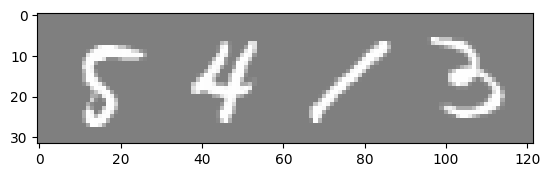

    5     4     1     3


In [ ]:
# Randomly select a few images from the training set
indices = torch.randperm(len(train_dataset))[:4]

# Prepare images and labels
images = torch.stack([train_dataset[i][0] for i in indices])
labels = [train_dataset[i][1] for i in indices]

# Show images and labels
# create grid of images
img_grid = torchvision.utils.make_grid(images)

img_grid.unnorm = unnormalize(img_grid)
imshow(img_grid.unnorm)
print(' '.join('%5s' % classes[labels[j]] for j in range(4)))

# Append the timestamp to the log_dir
if 'TENSORB_LOADED' in globals():
  if TENSORB_LOADED:
    # write to tensorboard the unnormalized images
    # Create a string representation of the current time
    writer = SummaryWriter(TENSORB_PATH + timestamp)
    writer.add_image(project_name + '_images', img_grid.unnorm)
    writer.close()

# Data Augmentation

In [ ]:
def apply(img, aug, num_rows=2, num_cols=4, scale=1):
    Y = [aug(img) for _ in range(num_rows * num_cols)]
    # create grid of images
    show_images(Y, num_rows, num_cols, scale=scale)

### Test with different augmentations

In [ ]:
if IS_COLAB:
  from google.colab import drive
  drive.mount('/content/gdrive')

# Setup path but not mounted yet
#IMAGE_PATH = F"/content/gdrive/My Drive/Teaching/Kaplan/Lessons/Lesson10/images/"

my_file = Path(IMAGE_PATH + 'cat.jpg')
if my_file.is_file():
    # file exists
    image = Image.open(my_file)
else:
    raise FileNotFoundError(f'Missing: {my_file}')


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


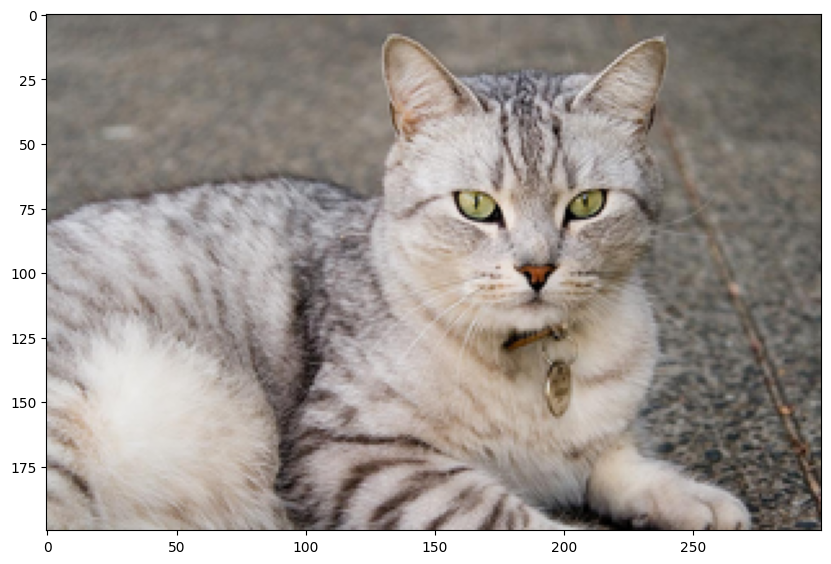

h200 x w300


In [ ]:
# Set the figure size
plt.figure(figsize=(10,10))

# Resize the image
max_size = (300, 300)  # replace with the size you want
image.thumbnail(max_size)

# # If processing is needed
# # transform to image tensor and then transform back
# transform = transforms.ToTensor()
# image = transform(image)

# # from torchvision.transforms.functional import to_pil_image
# # image = to_pil_image(image)
# # Display the image
plt.imshow(image)
plt.show()

# Print size
print(f'h{image.height} x w{image.width}')

#### Different Augmentations

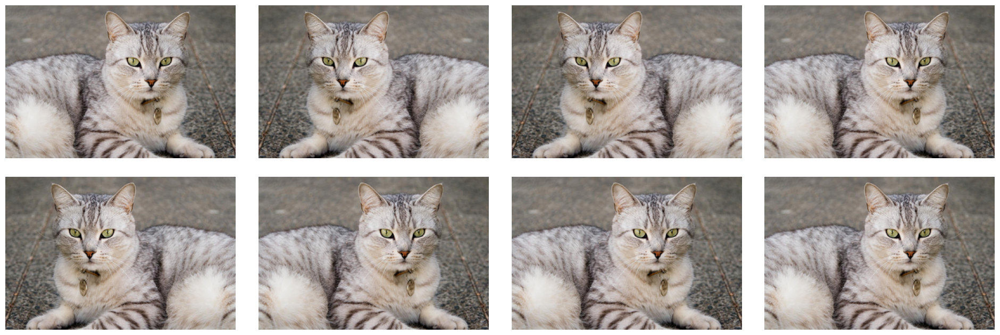

In [ ]:
apply(image, torchvision.transforms.RandomHorizontalFlip())

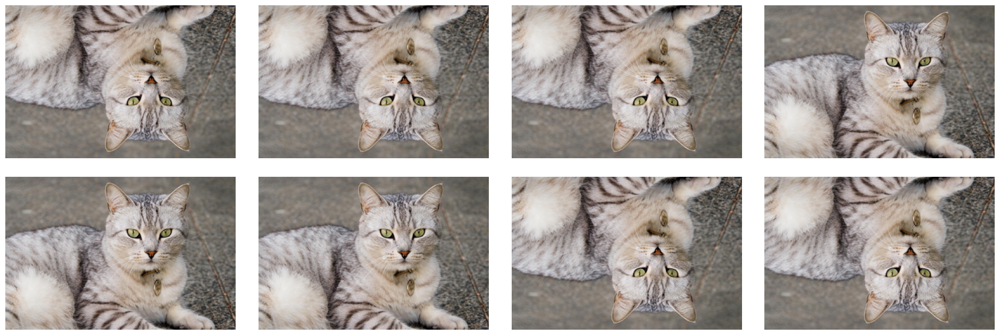

In [ ]:
apply(image, torchvision.transforms.RandomVerticalFlip())

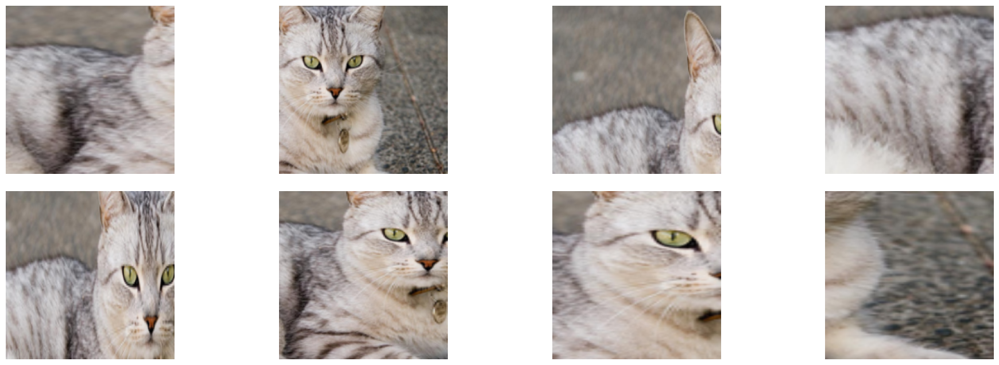

In [ ]:
shape_aug = torchvision.transforms.RandomResizedCrop(
    (200, 200), scale=(0.1, 1), ratio=(0.5, 2))
apply(image, shape_aug)

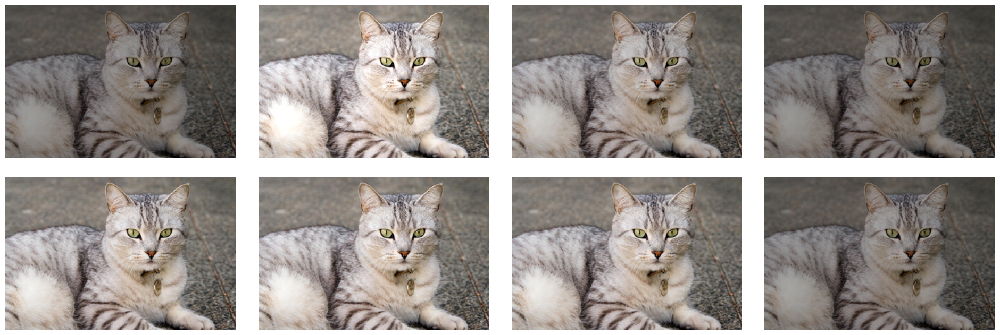

In [ ]:
apply(image, torchvision.transforms.ColorJitter(
    brightness=0.5, contrast=0, saturation=0, hue=0))

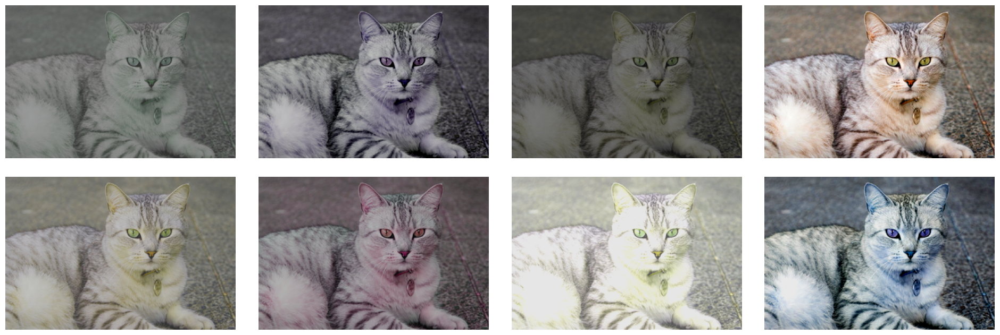

In [ ]:
color_aug = torchvision.transforms.ColorJitter(
    brightness=0.5, contrast=0.5, saturation=0.5, hue=0.5)
apply(image, color_aug)

In [ ]:
augs = torchvision.transforms.Compose([
    torchvision.transforms.RandomHorizontalFlip(), color_aug, shape_aug])
apply(image, augs)

### Number of bounding boxes

In [ ]:
# Creating the bounding boxes
X = torch.rand(size=(1, 3, image.height, image.width))  # Construct input data
Y = multibox_prior(X, sizes=[0.75, 0.5, 0.25], ratios=[1, 2, 0.5])
Y.shape

torch.Size([1, 300000, 4])

# k-fold Cross Validation

In [ ]:
# Combine train_dataset and val_dataset
# for the purpose of k-fold cross validation only
trainset = ConcatDataset([train_dataset, val_dataset])

## Getting the ith fold

In [ ]:
# Note that this function takes a combined dataset of
# train_dataset and val_dataset
def get_k_fold_data(k, i, combined_dataset):

    fold_size = len(combined_dataset) // k
    indices = list(range(len(combined_dataset)))

    val_indices = indices[i * fold_size: (i+1) * fold_size]
    train_indices = indices[:i * fold_size] + indices[(i+1) * fold_size:]

    train_subset = Subset(combined_dataset, train_indices)
    val_subset = Subset(combined_dataset, val_indices)

    return train_subset, val_subset

### Testing K-fold Validation

In [ ]:
# Example data
X = pd.DataFrame(np.random.randn(100, 3))  # Features
y = pd.Series(np.random.randint(0, 2, 100))  # Labels

# Print the shapes of the overall dataset
print("Training data shapes:")
print("X:", X.shape)
print("y:", y.shape)

# Parameters for k-fold cross-validation
k = 3  # Number of folds
i = 1  # Index of the current fold (0 to k-1)

# Create TensorDatasets
# Convert pandas DataFrame and Series to PyTorch tensors
X_tensor = torch.tensor(X.values, dtype=torch.float32)
y_tensor = torch.tensor(y.values, dtype=torch.float32)
train_dataset_eg = ConcatDataset([X_tensor, y_tensor])

# Split the data into training and validation sets
print(f'Current fold {i}')
train_subset_eg, val_subset_eg = get_k_fold_data(k, i, train_dataset_eg)

# Print the shapes of the resulting datasets
# Get the sizes of the training and validation sets
print("Training set size:", len(train_subset_eg))
print("Validation set size:", len(val_subset_eg))

Training data shapes:
X: (100, 3)
y: (100,)
Current fold 1
Training set size: 134
Validation set size: 66


# Models

## Generative Adversarial Network (GAN)

### Generator

In [ ]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        inputSize: the dimension of the noise vector, a scalar
        outputSize: the dimension of the images, fitted for the dataset used, a scalar
          (MNIST images are 28 x 28 = 784 so that is the default)
    '''
    def __init__(self,
                 inputSize=10,
                 outputSize=784,
                 hidden_dim=128,
                 lr=0.001,
                 lossfn=nn.BCEWithLogitsLoss(),
                 target_type='long'):

      super(Generator, self).__init__()

      self.inputSize = inputSize
      self.lr = lr
      self.lossfn = lossfn
      self._target_type = target_type

      # Build the neural network
      self.hidden_dim = hidden_dim
      self.layers = nn.Sequential(
          self.get_generator_block(self.inputSize, self.hidden_dim),
          self.get_generator_block(self.hidden_dim, self.hidden_dim * 2),
          self.get_generator_block(self.hidden_dim * 2, self.hidden_dim * 4),
          self.get_generator_block(self.hidden_dim * 4, self.hidden_dim * 8),
          # Note the output should be the image dimension
          nn.Linear(self.hidden_dim * 8, outputSize),
          nn.Sigmoid()
      )

    def get_generator_block(self,input_dim, output_dim):
      '''
      Function for returning a block of the generator's neural network
      given input and output dimensions.
      Parameters:
          input_dim: the dimension of the input vector, a scalar
          output_dim: the dimension of the output vector, a scalar
      Returns:
          a generator neural network layer, with a linear transformation
            followed by a batch normalization and then a relu activation
      '''
      return nn.Sequential(
          nn.Linear(input_dim, output_dim),
          nn.BatchNorm1d(output_dim),
          nn.ReLU(inplace=True)
      )

    def forward(self,X):
      '''
      Function for completing a forward pass of the generator: Given a noise tensor,
      returns generated images.
      Parameters:
          X: a noise tensor with dimensions (inputSize)
      '''
      return self.layers(X)

    ## The loss function
    def loss(self, batch_size, real):

      noise_vectors = torch.randn(batch_size,
                                  self.inputSize,
                                  device=device)

      fake = self.layers(noise_vectors)
      disc_prediction = self.disc(fake)

      # Generator's loss is discriminator's ability to detect its a fake
      # The smaller this loss, the better.
      gen_loss = self.lossfn(disc_prediction,
                             torch.ones_like(disc_prediction,device=device))
      return gen_loss

    ## The optimization algorithm
    #  Let's this time use Adam, which is the most commonly used optimizer in neural networks
    def configure_optimizers(self,weight_decay=0.01):
      # return torch.optim.SGD(self.parameters(), self.lr)
      return torch.optim.Adam(self.parameters(),
                              lr=self.lr,
                              weight_decay=weight_decay,
                              betas=(0.9, 0.999))

    def setLearningRate(self,lr):
      self.lr = lr

    def getLearningRate(self):
      return self.lr

    def getName(self):
      return type(self).__name__

    def set_disc(self,disc):
      self.disc = disc

    def get_gen(self):
      return self.layers

    def set_gen(self,layers):
      self.layers = layers

In [ ]:
gen = Generator(lr=0.00001)
summary(gen, input_size=(10,), device='cpu')

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                  [-1, 128]           1,408
       BatchNorm1d-2                  [-1, 128]             256
              ReLU-3                  [-1, 128]               0
            Linear-4                  [-1, 256]          33,024
       BatchNorm1d-5                  [-1, 256]             512
              ReLU-6                  [-1, 256]               0
            Linear-7                  [-1, 512]         131,584
       BatchNorm1d-8                  [-1, 512]           1,024
              ReLU-9                  [-1, 512]               0
           Linear-10                 [-1, 1024]         525,312
      BatchNorm1d-11                 [-1, 1024]           2,048
             ReLU-12                 [-1, 1024]               0
           Linear-13                  [-1, 784]         803,600
          Sigmoid-14                  [

#### Test Generator

In [ ]:
# Verify the generator class
def test_generator(z_dim, im_dim, hidden_dim, num_test=10000):
    gen = Generator(z_dim, im_dim, hidden_dim).get_gen()

    # Check there are six modules in the sequential part
    assert len(gen) == 6
    test_input = torch.randn(num_test, z_dim)
    test_output = gen(test_input)

    # Check that the output shape is correct
    assert tuple(test_output.shape) == (num_test, im_dim)
    assert test_output.max() < 1, "Make sure to use a sigmoid"
    assert test_output.min() > 0, "Make sure to use a sigmoid"
    assert test_output.min() < 0.5, "Don't use a block in your solution"
    assert test_output.std() > 0.05, "Don't use batchnorm here"
    assert test_output.std() < 0.15, "Don't use batchnorm here"

test_generator(5, 10, 20)
test_generator(20, 8, 24)
print("Success!")

Success!


### Discriminator

In [ ]:
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self,
                 inputSize=784,
                 hidden_dim=128,
                 outputSize=1,
                 lr=0.001,
                 lossfn=nn.BCEWithLogitsLoss(),
                 target_type='long'):

      super(Discriminator, self).__init__()

      self.inputSize = inputSize
      self.lr = lr
      self.lossfn = lossfn
      self._target_type = target_type

      # Build the network
      self.hidden_dim = hidden_dim
      self.layers = nn.Sequential(
          self.get_discriminator_block(self.inputSize, self.hidden_dim * 4),
          self.get_discriminator_block(self.hidden_dim * 4, self.hidden_dim * 2),
          self.get_discriminator_block(self.hidden_dim * 2, self.hidden_dim),
          nn.Linear(self.hidden_dim,outputSize)
      )

    def get_discriminator_block(self,input_dim, output_dim):
      '''
      Discriminator Block
      Function for returning a neural network of the discriminator given input and output dimensions.
      Parameters:
          input_dim: the dimension of the input vector, a scalar
          output_dim: the dimension of the output vector, a scalar
      Returns:
          a discriminator neural network layer, with a linear transformation
            followed by an nn.LeakyReLU activation with negative slope of 0.2
      '''
      return nn.Sequential(
          nn.Linear( input_dim, output_dim ),
          nn.LeakyReLU(negative_slope=0.2,inplace=True)
      )

    def forward(self,X):
      '''
      Function for completing a forward pass of the discriminator: Given an image tensor,
      returns a 1-dimension tensor representing fake/real.
      Parameters:
          image: a flattened image tensor with dimension (inputSize)
      '''
      return self.layers(X)

    ## The loss function
    ## z_dim is the size of the noise vector
    def loss(self, criterion, batch_size, z_dim, real, device):

      noise_vectors = torch.randn(batch_size,
                                  z_dim,
                                  device=device)

      fake = self.gen(noise_vectors).detach()

      # Compute discriminator loss
      # Ability to detect fake, so nearer prediction is to 0 the better
      prediction_fake = self(fake)
      fake_loss = criterion(prediction_fake,
                              torch.zeros_like(prediction_fake,device=device))

      # Ability to detect real, so nearer prediction is to 1 the better
      prediction_real = self(real)
      real_loss = criterion(prediction_real,
                              torch.ones_like(prediction_real,device=device))

      # Take average to be the final discriminator loss
      disc_loss = (fake_loss + real_loss)/2
      return disc_loss

    ## The optimization algorithm
    #  Let's this time use Adam, which is the most commonly used optimizer in neural networks
    def configure_optimizers(self,weight_decay=0.01):
      # return torch.optim.SGD(self.parameters(), self.lr)
      return torch.optim.Adam(self.parameters(),
                              lr=self.lr,
                              weight_decay=weight_decay,
                              betas=(0.9, 0.999))

    def setLearningRate(self,lr):
      self.lr = lr

    def getLearningRate(self):
      return self.lr

    def getName(self):
      return type(self).__name__

    def set_gen(self,gen):
      self.gen = gen

    def get_gen(self):
      return gen

    def get_disc(self):
      return self.layers

    def set_disc(self,layers):
      self.layers = layers

In [ ]:
disc = Discriminator(lr=0.00001)
summary(disc, input_size=(784,), device='cpu')

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                  [-1, 512]         401,920
         LeakyReLU-2                  [-1, 512]               0
            Linear-3                  [-1, 256]         131,328
         LeakyReLU-4                  [-1, 256]               0
            Linear-5                  [-1, 128]          32,896
         LeakyReLU-6                  [-1, 128]               0
            Linear-7                    [-1, 1]             129
Total params: 566,273
Trainable params: 566,273
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.01
Params size (MB): 2.16
Estimated Total Size (MB): 2.18
----------------------------------------------------------------


#### Test Discriminator

In [ ]:
def test_discriminator(z_dim, hidden_dim, num_test=100):

    disc = Discriminator(z_dim, hidden_dim).get_disc()

    # Check there are three parts
    assert len(disc) == 4

    # Check the linear layer is correct
    test_input = torch.randn(num_test, z_dim)
    test_output = disc(test_input)
    assert tuple(test_output.shape) == (num_test, 1)

    # Don't use a block
    assert not isinstance(disc[-1], nn.Sequential)

test_discriminator(5, 10)
test_discriminator(20, 8)
print("Success!")

Success!


In [ ]:
import torch.nn as nn

# Load MNIST dataset as tensors
dataloader = DataLoader(
    torchvision.datasets.MNIST('.', download=True, transform=transforms.ToTensor()),
    batch_size=128,
    shuffle=True)

class LambdaModule(nn.Module):
    def __init__(self, lambd):
        super(LambdaModule, self).__init__()
        self.lambd = lambd

    def forward(self, *args):
        return self.lambd(*args)

def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
  model = Discriminator(z_dim)

  model.set_disc(disc)
  model.set_gen(gen)

  return model.loss(criterion, num_images, z_dim, real, device)

def test_disc_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_disc_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None

    z_dim = 64
    gen = torch.zeros_like
    disc = LambdaModule(lambda x: x.mean(1)[:, None])
    criterion = LambdaModule(torch.mul) # Multiply
    real = torch.ones(num_images, z_dim)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(disc_loss.mean() - 0.5) < 1e-5)

    gen = torch.ones_like
    criterion = LambdaModule(torch.mul) # Multiply
    real = torch.zeros(num_images, z_dim)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')) < 1e-5)

    gen = lambda x: torch.ones(num_images, 10)
    disc = LambdaModule(lambda x: x.mean(1)[:, None] + 10)
    criterion = LambdaModule(torch.mul) # Multiply
    real = torch.zeros(num_images, 10)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu').mean() - 5) < 1e-5)

    gen = torch.ones_like
    disc = nn.Linear(64, 1, bias=False)
    real = torch.ones(num_images, 64) * 0.5
    disc.weight.data = torch.ones_like(disc.weight.data) * 0.5
    disc_opt = torch.optim.Adam(disc.parameters(), lr=0.00001)
    criterion = LambdaModule(lambda x, y: torch.sum(x) + torch.sum(y))
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu').mean()
    disc_loss.backward()
    assert torch.isclose(torch.abs(disc.weight.grad.mean() - 11.25), torch.tensor(3.75))

def test_disc_loss(max_tests = 10):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=0.00001)
    disc = Discriminator().to(device)
    disc_opt = torch.optim.Adam(disc.parameters(), lr=0.00001)
    num_steps = 0
    for real, _ in dataloader:
        cur_batch_size = len(real)
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradient before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, nn.BCEWithLogitsLoss(), real, cur_batch_size, z_dim, device)
        assert (disc_loss - 0.68).abs() < 0.05

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Check that they detached correctly
        assert gen.get_gen()[0][0].weight.grad is None

        # Update optimizer
        old_weight = disc.get_disc()[0][0].weight.data.clone()
        disc_opt.step()
        new_weight = disc.get_disc()[0][0].weight.data

        # Check that some discriminator weights changed
        assert not torch.all(torch.eq(old_weight, new_weight))
        num_steps += 1
        if num_steps >= max_tests:
            break

test_disc_reasonable()
test_disc_loss()
print("Success!")

100%|██████████| 9912422/9912422 [00:00<00:00, 104692540.94it/s]


Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw



100%|██████████| 28881/28881 [00:00<00:00, 27081532.27it/s]


Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 26358302.45it/s]


Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw



100%|██████████| 4542/4542 [00:00<00:00, 4463572.81it/s]


Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw

Success!


## Convolutional Autoencoder

In [ ]:
class Encoder(nn.Module):

    def __init__(self,
                 encoded_space_dim,
                 fc2_input_dim,
                 lr=0.001,
                 lossfn=nn.MSELoss(),
                 target_type='float' ):
        super().__init__()

        self.lr = lr
        self.lossfn = lossfn
        self.target_type = target_type

        ### Convolutional section
        self.encoder_cnn = nn.Sequential(
            nn.Conv2d(in_channels=1,
                      out_channels=8,
                      kernel_size=3,
                      stride=2,
                      padding=1),
            nn.ReLU(True),
            nn.Conv2d(8, 16, 3, stride=2, padding=1),
            nn.BatchNorm2d(16),
            nn.ReLU(True),
            nn.Conv2d(16, 32, 3, stride=2, padding=0),
            nn.ReLU(True)
        )

        ### Flatten layer with first dim (default)
        self.flatten = nn.Flatten(start_dim=1)

        ### Linear section
        self.encoder_lin = nn.Sequential(
            nn.Linear(3 * 3 * 32, fc2_input_dim),
            nn.ReLU(True),
            nn.Linear(fc2_input_dim, encoded_space_dim)
        )

    def forward(self, x):
        x = self.encoder_cnn(x)
        x = self.flatten(x)
        x = self.encoder_lin(x)
        return x

class Decoder(nn.Module):

    def __init__(self,
                 encoded_space_dim,
                 fc2_input_dim,
                 lr=0.001,
                 lossfn=nn.MSELoss(),
                 target_type='float'):
        super().__init__()

        self.lr = lr
        self.lossfn = lossfn
        self.target_type = target_type

        self.decoder_lin = nn.Sequential(
            nn.Linear(encoded_space_dim, fc2_input_dim),
            nn.ReLU(True),
            nn.Linear(fc2_input_dim, 3 * 3 * 32),
            nn.ReLU(True)
        )

        self.unflatten = nn.Unflatten(dim=1,
                                      unflattened_size=(32, 3, 3))

        self.decoder_conv = nn.Sequential(

            # This operation is essentially the reverse of a
            # Conv2d operation and is typically used to increase the spatial
            # dimensions of the input, i.e., it's often used for upsampling.
            nn.ConvTranspose2d(in_channels=32,
                               out_channels=16,
                               kernel_size=3,
                               stride=2,
                               output_padding=0),
            nn.BatchNorm2d(16),
            nn.ReLU(True),
            nn.ConvTranspose2d(16, 8, 3, stride=2,
            padding=1, output_padding=1),
            nn.BatchNorm2d(8),
            nn.ReLU(True),
            nn.ConvTranspose2d(8, 1, 3, stride=2,
            padding=1, output_padding=1)
        )

    def forward(self, x):
        x = self.decoder_lin(x)
        x = self.unflatten(x)
        x = self.decoder_conv(x)
        x = torch.sigmoid(x)
        return x

class Autoencoder(nn.Module):

    def __init__(self,
                 encoded_space_dim=4,
                 fc2_input_dim=128,
                 lr=0.001,
                 lossfn=nn.MSELoss(),
                 target_type='float'):
      super().__init__()

      self.encoded_space_dim=encoded_space_dim
      self.fc2_input_dim=fc2_input_dim
      self.lr = lr
      self.lossfn = lossfn
      self.target_type = target_type
      self.latent_code = None

      # Create an encoder
      self.encoder = Encoder(self.encoded_space_dim,
                             self.fc2_input_dim,
                             lr=self.lr,
                             lossfn=self.lossfn,
                             target_type=self.target_type)

      # Create a decoder that mirrors the encoder
      self.decoder = Decoder(self.encoded_space_dim,
                             self.fc2_input_dim,
                             lr=self.lr,
                             lossfn=self.lossfn,
                             target_type=self.target_type)

      self.params_to_optimize = [
          {'params': self.encoder.parameters()},
          {'params': self.decoder.parameters()}
      ]

    # Forward Propagation
    # Output from encoder goes into decoder
    def forward(self, x):
      self.latent_code = self.encoder.forward(x)
      return self.decoder.forward(self.latent_code)

    ## The loss function
    # No need for prediction since output predicted is
    # the input, but we just follow the signature.
    def loss(self, y_hat, y):
      target = y.float().type(torch.LongTensor
                              if self.target_type == 'long'
                              else torch.FloatTensor)
      target = target.to(y_hat.device)
      return self.lossfn(y_hat, target)

    ## The optimization algorithm
    #  Let's this time use Adam, which is the most commonly used optimizer in neural networks
    def configure_optimizers(self,weight_decay=0.01):
      # return torch.optim.SGD(self.parameters(), self.lr)
      return torch.optim.Adam(self.params_to_optimize,
                              lr=self.lr,
                              weight_decay=weight_decay,
                              betas=(0.9, 0.999))

    def setLearningRate(self,lr):
      self.lr = lr

    def getLearningRate(self):
      return self.lr

    def getName(self):
      return type(self).__name__

### Peak Signal to Noise

Peak Signal-to-Noise Ratio (PSNR) is a metric that can handle both grayscale and color images without additional transformations. PSNR is often used in image processing to measure the quality of reconstructed images, with a higher PSNR indicating better reconstruction quality.

In [ ]:
def psnr(img1, img2):
    mse = torch.mean((img1 - img2) ** 2)
    if mse == 0:
        return 100
    MAX_I = 1.0
    # PSNR calculation typically assumes pixel values are in the range of [0, 255].
    # But pixel values are scaled to be in the range [0.0, 1.0] because of transforms.ToTensor()
    # Therefore 1.0 instead of 255 is used in the numerator.
    return 20 * torch.log10(MAX_I / torch.sqrt(mse))

### Plot output of autoencoder

In [ ]:
def plot_ae_outputs(encoder,decoder,n=10):

    plt.figure(figsize=(16,4.5))
    targets = test_dataset.targets.numpy()

    t_idx = {i:np.where(targets==i)[0][0] for i in range(n)}

    for i in range(n):

      ax = plt.subplot(2,n,i+1)

      # used to extract the ith image from the test dataset and
      # then it will be increased by 1 dimension on the 0 axis. This
      # step is needed to pass the image to the autoencoder.
      img = test_dataset[t_idx[i]][0].unsqueeze(0).to(device)

      encoder.eval()
      decoder.eval()

      with torch.no_grad():
         rec_img  = decoder(encoder(img))

      # used to plot the original image. squeeze()removes the dimension
      # added before and is essential to visualize the image. numpy()
      # transforms a tensor into a n-dimensional array, which is the only
      # type of object accepted by the function plt.imshow. numpy() returns
      # a copy of the tensor object into CPU memory.
      plt.imshow(img.cpu().squeeze().numpy(), cmap='gist_gray')
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)

      if i == n//2:
        ax.set_title('Original images')

      ax = plt.subplot(2, n, i + 1 + n)
      plt.imshow(rec_img.cpu().squeeze().numpy(), cmap='gist_gray')
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)

      if i == n//2:
         ax.set_title('Reconstructed images')
    plt.show()

In [ ]:
model = Autoencoder(lr=0.001)
summary(model, input_size=(1, 28, 28), device='cpu')


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1            [-1, 8, 14, 14]              80
              ReLU-2            [-1, 8, 14, 14]               0
            Conv2d-3             [-1, 16, 7, 7]           1,168
       BatchNorm2d-4             [-1, 16, 7, 7]              32
              ReLU-5             [-1, 16, 7, 7]               0
            Conv2d-6             [-1, 32, 3, 3]           4,640
              ReLU-7             [-1, 32, 3, 3]               0
           Flatten-8                  [-1, 288]               0
            Linear-9                  [-1, 128]          36,992
             ReLU-10                  [-1, 128]               0
           Linear-11                    [-1, 4]             516
           Linear-12                  [-1, 128]             640
             ReLU-13                  [-1, 128]               0
           Linear-14                  [

## MLP

In [ ]:
from itertools import chain
class MLP(nn.Module):
  '''
    Multilayer Perceptron.
    Specify hidden layers and size using (n1,n2,..,nm) notation
    where there are m layers, and ni is the number of nodes on
    layer i.
  '''
  def __init__(self,
               hidden_layers,
               outputSize=10,
               lr=0.01,
               lossfn=nn.CrossEntropyLoss(),
               target_type='long'):
    super().__init__()

    self.lr = lr
    self.lossfn = lossfn
    self.target_type = target_type

    # Create the MLP
    assert len(hidden_layers) > 0 and hidden_layers
    self.layers = nn.Sequential(nn.Flatten())
    self.layers.add_module('hidden', self.hiddenLayers(hidden_layers))
    self.layers.add_module('output', nn.Linear(hidden_layers[-1],outputSize))

  # Create the hidden layers, except the output layer
  def hiddenLayers(self,hidden_layers):
    layers = ((nn.LazyLinear(outputSize),nn.LazyBatchNorm1d(),nn.ReLU()) for outputSize in hidden_layers)
    layers = tuple(chain.from_iterable(layers))
    return nn.Sequential(*layers)

  ## The forward step
  def forward(self, X):
    # Computes the output given the input X
    return self.layers(X)

  ## The loss function
  def loss(self, y_hat, y):
    target = y.float().type(torch.LongTensor
                            if self.target_type == 'long'
                            else torch.FloatTensor)
    target = target.to(y_hat.device)
    return self.lossfn(y_hat, target)

  ## The optimization algorithm
  #  Let's this time use Adam, which is the most commonly used optimizer in neural networks
  def configure_optimizers(self,weight_decay=0.01):
    # return torch.optim.SGD(self.parameters(), self.lr)
    return torch.optim.Adam(self.parameters(),
                            self.lr,
                            weight_decay=weight_decay,
                            betas=(0.9, 0.999))

  def setLearningRate(self,lr):
    self.lr = lr

  def getLearningRate(self):
    return self.lr

  def getName(self):
    return type(self).__name__

In [ ]:
model = MLP(hidden_layers=(100,50), outputSize=1, lr=0.001)
summary(model, input_size=(channels, 28, 28),device='cpu')

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
           Flatten-1                  [-1, 784]               0
            Linear-2                  [-1, 100]          78,500
       BatchNorm1d-3                  [-1, 100]             200
              ReLU-4                  [-1, 100]               0
            Linear-5                   [-1, 50]           5,050
       BatchNorm1d-6                   [-1, 50]             100
              ReLU-7                   [-1, 50]               0
            Linear-8                    [-1, 1]              51
Total params: 83,901
Trainable params: 83,901
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.01
Params size (MB): 0.32
Estimated Total Size (MB): 0.33
----------------------------------------------------------------


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/lazy.py:180: UserWarning: Lazy modules are a new feature under heavy development so changes to the API or functionality can happen at any moment.
  warnings.warn('Lazy modules are a new feature under heavy development '


## LeNet 5

In [ ]:
class LeNet5(nn.Module):
  '''
    LeNet 5
  '''
  def __init__(self,
               outputSize=10,
               lr=0.01,
               lossfn=nn.CrossEntropyLoss(),
               target_type='long'):
    super().__init__()
    # Setting the learning rate
    self.lr = lr
    self.lossfn = lossfn
    self.target_type = target_type

    self.layers = nn.Sequential(
      # Layer 1
      nn.LazyConv2d(out_channels=6, kernel_size=5),
      nn.LazyBatchNorm2d(),
      nn.Sigmoid(),
      nn.AvgPool2d(kernel_size=2,stride=2),

      # Layer 2
      nn.LazyConv2d(out_channels=16, kernel_size=5),
      nn.LazyBatchNorm2d(),
      nn.Sigmoid(),
      nn.AvgPool2d(kernel_size=2,stride=2),

      # Dense Layers
      nn.Flatten(),
      nn.Linear(256,120),
      nn.LazyBatchNorm1d(),
      nn.Sigmoid(),
      nn.LazyLinear(84),
      nn.LazyBatchNorm1d(),
      nn.Sigmoid(),
      nn.LazyLinear(outputSize)
    )

  ## The forward step
  def forward(self, X):
    # Computes the output given the input X
    return self.layers(X)

  ## The loss function
  def loss(self, y_hat, y):
    target = y.float().type(torch.LongTensor
                            if self.target_type == 'long'
                            else torch.FloatTensor)
    target = target.to(y_hat.device)

    #print(target.shape)
    #print(y_hat.shape)

    return self.lossfn(y_hat, target)

  ## The optimization algorithm
  #  Let's this time use Adam, which is the most commonly used optimizer in neural networks
  def configure_optimizers(self,weight_decay=0.01):
    # return torch.optim.SGD(self.parameters(), self.lr)
    return torch.optim.Adam(self.parameters(),
                            self.lr,
                            weight_decay=weight_decay,
                            betas=(0.9, 0.999))

  def setLearningRate(self,lr):
    self.lr = lr

  def getLearningRate(self):
    return self.lr

  def getName(self):
    return type(self).__name__

Provide a summary of the model

In [ ]:
model = LeNet5(lr=0.001)
summary(model, input_size=(channels, 28, 28),device='cpu')

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1            [-1, 6, 24, 24]             156
       BatchNorm2d-2            [-1, 6, 24, 24]              12
           Sigmoid-3            [-1, 6, 24, 24]               0
         AvgPool2d-4            [-1, 6, 12, 12]               0
            Conv2d-5             [-1, 16, 8, 8]           2,416
       BatchNorm2d-6             [-1, 16, 8, 8]              32
           Sigmoid-7             [-1, 16, 8, 8]               0
         AvgPool2d-8             [-1, 16, 4, 4]               0
           Flatten-9                  [-1, 256]               0
           Linear-10                  [-1, 120]          30,840
      BatchNorm1d-11                  [-1, 120]             240
          Sigmoid-12                  [-1, 120]               0
           Linear-13                   [-1, 84]          10,164
      BatchNorm1d-14                   

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/lazy.py:180: UserWarning: Lazy modules are a new feature under heavy development so changes to the API or functionality can happen at any moment.
  warnings.warn('Lazy modules are a new feature under heavy development '


## ResNet (for channels of 3)

The first two layers of ResNet are: a 7 x 7 convolutional layer with 64 output channels and a stride of 2 is followed by the 3 x 3 max-pooling layer with a stride of 2. A batch normalization layer is added after each convolutional layer.

This is followed by 4 modules made up of residual blocks, each module uses several residual blocks with the same number of output channels.

The number of channels in the first module is the same as the number of input channels.

Since a max-pooling layer with a stride of 2 has already been used, it is not necessary to reduce the height and width.

In the first residual block for each of the subsequent modules, the number of channels is doubled compared with that of the previous module, and the height and width are halved.

In [ ]:
def init_cnn(module):
  if type(module) == nn.Linear or type(module) == nn.Conv2d:
      nn.init.xavier_uniform_(module.weight)

class ResNet(nn.Module):
  def __init__(self,
               arch,
               lr=0.001,
               num_classes=10,
               lossfn=nn.CrossEntropyLoss(),
               target_type='long'):
    # arch - is the architecture - for ResNet18, it should be of the form:
    #   ((2, 64), (2, 128), (2, 256), (2, 512))
    #    The first element of each pair is the the number of residual blocks in each block
    #     and the 2nd element is no. of output channels
    # num_Classes is the number of total outputs (no. of classes we are seeking to recognize)

    super().__init__()

    # Setting the learning rate
    self.lr = lr
    self.lossfn = lossfn
    self.classes = num_classes
    self.target_type = target_type

    # The first layer
    self.net = nn.Sequential()
    self.net.add_module('stem', self.stem())

    # Now the blocks
    for i, b in enumerate(arch):
      # print(f'b{i+2}') ==> for b2, b3, b4, etc. (the first param of add_module is the name of the module)
      # It is the same as writing: self.net.add_module(f'b{i+2}', self.block(b[0], b[1], first_block=(i==0)))
      self.net.add_module(f'b{i+2}', self.block(*b, first_block=(i==0)))

    # The last global average pooling followed by a fully connected layer
    self.net.add_module('head', self.head())

    # Initialize the weights of the network (see the function init_cnn above)
    self.net.apply(init_cnn)

  def stem(self):
    return nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3),
            nn.LazyBatchNorm2d(),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=3, stride=2, padding=1))

  def block(self, num_residuals, num_channels, first_block=False):
    blk = []
    for i in range(num_residuals):
        if i == 0 and not first_block:
            blk.append(Residual(num_channels, strides=2))
        else:
            blk.append(Residual(num_channels))
    return nn.Sequential(*blk)

  def head(self):
    return nn.Sequential(
            nn.AdaptiveAvgPool2d((1, 1)),
            nn.Flatten(),
            nn.LazyLinear(self.classes))

  def getLayers(self):
    return self.net

  def layer_summary(self, X_shape):
    X = torch.randn(*X_shape)
    for layer in self.net:
        X = layer(X)
        print(layer.__class__.__name__, 'output shape:\t', X.shape)

  ## The forward step
  def forward(self, X):
    # Computes the output given the input X
    return self.layers(X)

  ## The loss function
  def loss(self, y_hat, y):
    target = y.float().type(torch.LongTensor
                            if self.target_type == 'long'
                            else torch.FloatTensor)
    target = target.to(y_hat.device)
    return self.lossfn(y_hat, target)

  ## The optimization algorithm
  #  Let's this time use Adam, which is the most commonly used optimizer in neural networks
  def configure_optimizers(self,weight_decay=0.01):
    # return torch.optim.SGD(self.parameters(), self.lr)
    return torch.optim.Adam(self.parameters(),
                            self.lr,
                            weight_decay=weight_decay,
                            betas=(0.9, 0.999))

  def setLearningRate(self,lr):
    self.lr = lr

  def getLearningRate(self):
    return self.lr

  def getName(self):
    return type(self).__name__

class Residual(nn.Module):
    """The Residual block of ResNet."""
    def __init__(self, num_out_channels, strides=1):
        super().__init__()

        # The 1st convolutional layer (conv 3 x 3) and strides strides
        self.conv1 = nn.LazyConv2d(num_out_channels, kernel_size=3, stride=strides, padding=1)

        # The 2nd convolutional layer (conv 3 x 3)
        self.conv2 = nn.LazyConv2d(num_out_channels, kernel_size=3, padding=1)

        # If we need to adjust the size of X to match the size of Y
        if strides > 1:
            self.conv3 = nn.LazyConv2d(num_out_channels, kernel_size=1, stride=strides)
        else:
            self.conv3 = None

        # The first batch normalization layer
        self.bn1 = nn.LazyBatchNorm2d()

        # The 2ns bacth normalization layer
        self.bn2 = nn.LazyBatchNorm2d()

    def forward(self, X):
        # Apply the 1st conv to X, followed by bn1 and then relu
        Y = F.relu(self.bn1(self.conv1(X)))

        # Apply the 2nd conv to Y, followed by bn2
        Y = self.bn2(self.conv2(Y))
        # print(Y.shape)

        # if you want to change the shape of x
        if self.conv3:
            X = self.conv3(X)

        # Add  X to Y
        Y += X
        # print(Y.shape)
        # Apply relu to Y and return it as the output of the forward pass
        return F.relu(Y)

class ResNet18(ResNet):
    def __init__(self, lr=0.1, num_Classes=10, lossfn=nn.CrossEntropyLoss(), target_type='long'):
        super().__init__(((2, 64), (2, 128), (2, 256), (2, 512)), lr, num_Classes, lossfn=lossfn, target_type=target_type)
        self.layers = super().getLayers()

Provide a summary of the model

In [ ]:
summary(Residual(5, strides=2), input_size=(3, 28, 28), device='cpu')
model = ResNet18(lr=0.001)
model.layer_summary((1, 3, 96, 96)) # input channels = 3

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1            [-1, 5, 14, 14]             140
       BatchNorm2d-2            [-1, 5, 14, 14]              10
            Conv2d-3            [-1, 5, 14, 14]             230
       BatchNorm2d-4            [-1, 5, 14, 14]              10
            Conv2d-5            [-1, 5, 14, 14]              20
Total params: 410
Trainable params: 410
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.01
Forward/backward pass size (MB): 0.04
Params size (MB): 0.00
Estimated Total Size (MB): 0.05
----------------------------------------------------------------
Sequential output shape:	 torch.Size([1, 64, 24, 24])
Sequential output shape:	 torch.Size([1, 64, 24, 24])
Sequential output shape:	 torch.Size([1, 128, 12, 12])
Sequential output shape:	 torch.Size([1, 256, 6, 6])
Sequential output shape:	 

Example where input and output are of the same shape, where 1 x 1 convolution is not needed.

In [ ]:
blk = Residual(3)
X = torch.randn(4, 3, 6, 6) # define shape of input tensor, m=4, channels=3, height=6, width=4
blk(X).shape

torch.Size([4, 3, 6, 6])

Define output channels = 6, but use strides = 2 to halve

In [ ]:
blk = Residual(6, strides=2)
blk(X).shape

torch.Size([4, 6, 3, 3])

## Visualize the Network in TensorBoard

In [ ]:
# Randomly select a few images from the training set
indices = torch.randperm(len(train_dataset))[:4]

## Let's see the network model
if 'TENSORB_LOADED' in globals():
  if TENSORB_LOADED:
    writer = SummaryWriter(TENSORB_PATH + timestamp)
    dummy_images = torch.stack([train_dataset[i][0] for i in indices])
    model, dummy_images = model.to(device), dummy_images.to(device)
    writer.add_graph(model, dummy_images)
    writer.close()

# Training

In [ ]:
class Trainer:

  def __init__(self,
               writer=None,
               n_epochs=3,
               verbose=False,
               ignore_accuracy=False,
               input_as_target=False,
               compute_psnr=False):
    self.max_epochs = n_epochs
    self.accuracies = []
    self.verbose = verbose

    # SummaryWriter for TensorBoard
    self.writer = writer

    # this for regression problems
    self.ignore_accuracy = ignore_accuracy

    # this for autoencoder output comparisons
    self.compute_psnr = compute_psnr

    # setting this true is for autoencoders that use the inputs
    # to train the output of a encoder-decoder architecture
    self.input_as_target = input_as_target
    return

  # Add a new function to get the target type
  def get_target_type(self):
    return torch.long if self.target_type == 'long' else torch.float

  # The fitting step
  def fit(self, model, train_loader, val_loader, weight_decay=0.01):

    self.training_data    = train_loader
    self.validation_data  = val_loader
    self.epoch_stats = {'Training':[],
                        'Validation':[],
                        'Accuracy':[],
                        'PSNR':[]}
    self.exclude = []

    # configure the optimizer
    self.optimizer = model.configure_optimizers(weight_decay=weight_decay)
    self.model     = model

    if self.verbose:
      print(f'Starting {model.getName()} model training for {self.max_epochs} epochs:')

    for epoch in range(self.max_epochs):

      # Compute training loss
      tr = self.fit_epoch()
      # Compute validation loss and accuracy
      acc, val, psnr = self.validate()

      self.epoch_stats['Training'].append(tr)
      self.epoch_stats['Accuracy'].append(acc)
      self.epoch_stats['Validation'].append(val)
      self.epoch_stats['PSNR'].append(psnr)

      if self.writer:
        # send loss to TensorBoard
        self.writer.add_scalars("Loss",{'validation': val,'training': tr},epoch)
        # send accuracy to TensorBoard
        if not self.ignore_accuracy:
           self.writer.add_scalar("Accuracy", acc, epoch)
        # send psnr to TensorBoard
        if self.compute_psnr:
          self.writer.add_scalar("PSNR", psnr, epoch)

      if self.verbose:
        print(f'\tLoss at epoch {epoch}: T {tr:,.3f} V {val:,.3f}')
      if not self.ignore_accuracy:
        print(f'\tAccuracy after epoch {epoch}: {acc*100:.3f} %')
      if self.compute_psnr:
        print(f'\tPSNR after epoch {epoch}: {psnr:.3f} %\n')
        plot_ae_outputs( self.model.encoder, self.model.decoder, n=10)

    if self.verbose:
      print("Training process has finished.")
      plot_curves(self.epoch_stats,
                  "Epoch",
                  "Average Loss",
                   ["PSNR","Accuracy"] if self.ignore_accuracy else ["PSNR"])

    return {  'epoch': self.max_epochs,
              'model_state_dict': self.model.state_dict(),
              'optimizer_state_dict': self.optimizer.state_dict(),
              'statistics': self.epoch_stats}

  def fit_epoch(self):

    # set model to training mode
    self.model.train()

    # current_loss = 0.0
    all_losses = []

    # iterate over the DataLoader for training data
    for i, data in enumerate(self.training_data,0):

      # Get input and send mini-batch to GPU
      input = data[0].to(device)
      target = input if self.input_as_target else data[1].to(device)
      #print(target.shape)

      # Clear gradient buffers because we don't want any gradient from previous
      # epoch to carry forward, dont want to cummulate gradients
      self.optimizer.zero_grad()

      # get output from the model, given the inputs
      # never call forward directly
      output = self.model(input)
      #print(output.shape)

      # get loss for the predicted output
      loss = self.model.loss(output, target)

      # save the loss for plotting
      all_losses.append(loss.item())

      # get gradients w.r.t the parameters of the model
      loss.backward()

      # update the parameters (perform optimization)
      self.optimizer.step()

      # Let's print some statisics
      # current_loss += loss.item()
      # if i % 500 == 499:
      #     # print('Loss after mini-batch %5d: %.3f' %
      #     #        (i + 1, current_loss / 500))
      #     current_loss = 0.0

    return sum(all_losses)/len(all_losses)  # return average loss

  def validate(self):

      self.model.eval()  # Set the model to evaluation mode

      correct = 0
      total = 0
      avg_loss = 0.
      avg_psnr = 0.
      accuracy = 0.

      with torch.no_grad():  # Do not compute gradients

          for data in self.validation_data:

              input = data[0].to(device)
              target = input if self.input_as_target else data[1].to(device)

              output = self.model(input)

              # get loss for the predicted output
              avg_loss += self.model.loss(output,target)

              # calculate psnr for autoencoding problems
              if self.compute_psnr:
                avg_psnr += psnr(output, target)

              # calculate accuracy for classification problems
              if not self.ignore_accuracy:
                _, predicted = torch.max(output, 1)
                total += target.size(0)
                correct += (predicted == target).sum().item()

      if not self.ignore_accuracy:
        accuracy = correct / total

      if isinstance(avg_loss, torch.Tensor):
          # Convert tensor to a float
          avg_loss = float(avg_loss.item())

      avg_loss /= len(self.validation_data)

      if isinstance(avg_psnr, torch.Tensor):
          # Convert tensor to a float
          avg_psnr = float(avg_psnr.item())

      avg_psnr /= len(self.validation_data)

      return accuracy, avg_loss, avg_psnr




def train(model,
          n_epochs,
          train_dataset,
          val_dataset,
          batch_size,
          weight_decay=1e-05,
          writer=None,
          use_saved_weights=False,
          new_lr=None,
          verbose=False,
          ignore_accuracy=False,
          input_as_target=False,
          compute_psnr=False):

  # Create DataLoaders for each set
  train_loader = DataLoader(train_dataset,
                            shuffle=True,
                            batch_size=batch_size,
                            num_workers=2)

  val_loader = DataLoader(val_dataset,
                          shuffle=True,
                          batch_size=batch_size,
                          num_workers=2)

  # Check if the weights file exists, if true, fine tune learning rate
  if 'MODEL_PATH' in globals() and os.path.isfile(MODEL_PATH) and use_saved_weights:

      # Load the model from the file
      checkpoint = torch.load(MODEL_PATH)
      # print(f'Saved model: {MODEL_PATH}')

      model.load_state_dict(checkpoint['model_state_dict'])
      if verbose:
        print(f'Loaded model weights')

      optimizer = model.configure_optimizers()
      optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
      # print(f'Loaded optimizer parameters')

      # Fine tuning the learning rate
      learning_rate = new_lr if new_lr else model.getLearningRate()

      for param_group in optimizer.param_groups:
          param_group['lr'] = learning_rate
      # print(f'Learning rate: {learning_rate} Epochs: {n_epochs}')
  else:
      if verbose:
        print("No weights file found. Using randomly initialized weights.\n")

  # Training the network
  # Creating the trainer class
  trainer = Trainer(writer,
                    n_epochs=n_epochs,
                    verbose=verbose,
                    ignore_accuracy=ignore_accuracy,
                    input_as_target=input_as_target,
                    compute_psnr=compute_psnr)

  # Training the model
  checkpoint = trainer.fit(model, train_loader, val_loader, weight_decay)

  # Plot the results for average training and validation loss

  return model, trainer, checkpoint

# Model Tuning

In [ ]:
def logScale(a,b):
  assert a < b
  lb = np.log10(a)
  ub = np.log10(b)
  return np.arange(lb,ub,0.5)

def RandomLayers(layers,nodes):
  hidden_layers = []
  l = random.choice(layers)
  for layer in range(l):
    n = random.choice(nodes)
    hidden_layers.append(n)
  return tuple(hidden_layers)

def RandomChoice(hyperparams):
  return { key:random.choice(value) for _,(key,value) in enumerate(hyperparams.items()) }

In [ ]:
def k_fold(k,
           model,
           num_epochs,
           trainset,
           batch_size,
           weight_decay,
           learning_rate,
           verbose=False,
           ignore_accuracy=True,
           input_as_target=False,
           compute_psnr=False):

    accum_train_loss, accum_valid_loss = 0, 0

    assert k <= len(trainset)
    for i in range(k):

        # Get the ith fold
        train_dataset, val_dataset = get_k_fold_data(k, i, trainset)

        # Train using it num_epochs times
        model, _, checkpoint = train(model,
                                     num_epochs,
                                     train_dataset,
                                     val_dataset,
                                     batch_size,
                                     weight_decay,
                                     writer=None,
                                     new_lr=None,
                                     use_saved_weights=False,
                                     verbose=verbose,
                                     ignore_accuracy=ignore_accuracy,
                                     input_as_target=input_as_target,
                                     compute_psnr=compute_psnr)

        # Retrieve the statistics for the ith fold
        # which contains num_epochs
        stats = checkpoint['statistics']
        avg_train_loss = np.mean(stats['Training'])
        avg_valid_loss = np.mean(stats['Validation'])

        accum_train_loss += avg_train_loss
        accum_valid_loss += avg_valid_loss

        if verbose:
          print('fold %d/%d, epochs: %d, train loss: %f, valid loss: %f\n' % (
              i, k, num_epochs, avg_train_loss, avg_valid_loss))

    return accum_train_loss/k, accum_valid_loss/k

Find the best hyper parameters

In [ ]:
# Choose random layers and nodes per layer
layers = np.arange(2,10,1)
nodes = np.arange(20,160,20)

# Choose random values for hyperparameters
bsize = [2**n for n in np.arange(3,9,1)]
lr = np.round(10**logScale(0.0001,1),5)
decay = np.round(10**logScale(0.001,0.2),5)

hyperparams = {'bsize':bsize,
               'lr':lr,
               'decay':decay
               }

# Choose experiment parameters
sample_size = 3
kfolds = 3
num_epochs = 4

# Find the best sample
results = []
best_result = sys.float_info.max
best_index = 0
i = 0

while i < sample_size:

  choice = RandomChoice(hyperparams)
  choice['hidden'] = RandomLayers(layers,nodes)

  model = MLP(hidden_layers=choice['hidden'],
              outputSize=1,
              lr=choice['lr'],
              lossfn=nn.MSELoss(reduction='sum'),
              target_type='float')

  model = model.to(device)
  avg_train_loss, avg_valid_loss = k_fold(k=kfolds,
                                          model=model,
                                          num_epochs=num_epochs,
                                          trainset=trainset,
                                          batch_size=int(choice['bsize']),
                                          weight_decay=float(choice['decay']),
                                          learning_rate=int(choice['lr']),
                                          verbose=True,
                                          ignore_accuracy=True,
                                          input_as_target=False,
                                          compute_psnr=False)
  variance = abs(avg_train_loss-avg_valid_loss)

  print(f'-- Sample {i}/{sample_size} Average Training Loss: {avg_train_loss:,.2f}')
  print(f'-- Sample {i}/{sample_size} Difference with Validation: {variance:,.2f}\n')

  if avg_train_loss < best_result:
    best_result = avg_train_loss
    best_index = i

  results.append([avg_train_loss,variance,choice])
  i += 1

print(f'The best set of hyperparameters from')
print(f'Sample Size: {sample_size} Folds: {kfolds} Epochs: {num_epochs} is')
print(f'Sample #{best_index}: \n\tAverage Loss {results[best_index][0]:,.2f} and \n\tVariance {results[best_index][1]:,.2f}.\n')
print(f'Parameters: {results[best_index][2]}')


The best set of hyperparameters (out of 30 samples) is:
Sample #29:
	Average Loss 0.17 and
	Variance 0.08.

Parameters: {'bsize': 8, 'lr': 0.00316, 'decay': 0.1, 'hidden': (60, 20, 60, 100, 140)}

# Model Training

## Training for Supervised Learning

No weights file found. Using randomly initialized weights.

Starting LeNet5 model training for 4 epochs:
	Loss at epoch 0: T 0.332 V 0.196
	Accuracy after epoch 0: 94.075 %
	Loss at epoch 1: T 0.109 V 0.088
	Accuracy after epoch 1: 97.133 %
	Loss at epoch 2: T 0.088 V 0.056
	Accuracy after epoch 2: 98.242 %
	Loss at epoch 3: T 0.077 V 0.206
	Accuracy after epoch 3: 93.592 %
Training process has finished.


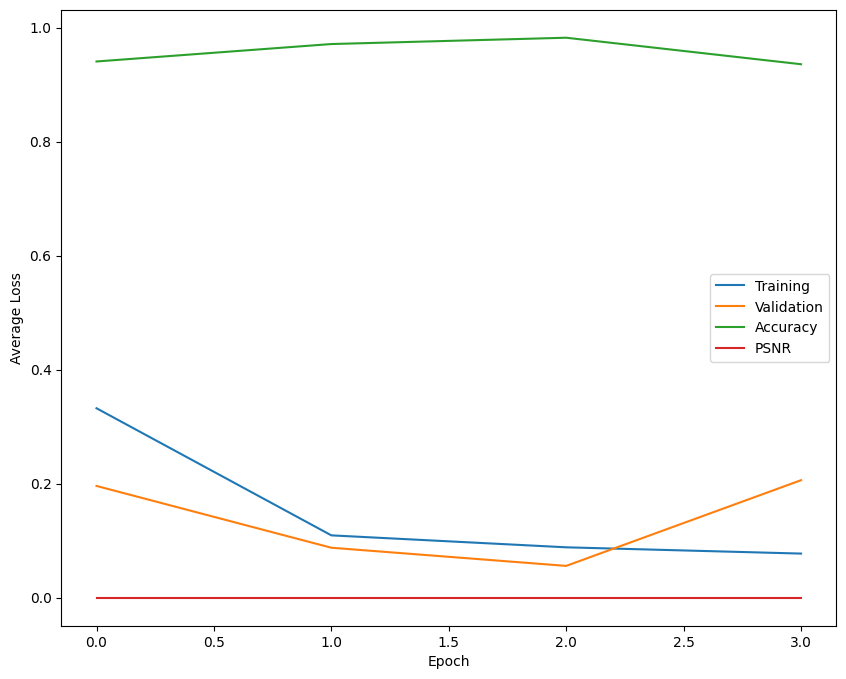

In [ ]:
# Create the NN Model

# Use this for Image Recognition
model = LeNet5(lr=0.001)
# model = ResNet18(lr=0.001)
#model = Autoencoder(lr=0.001)

# Use this for House Price Prediction
#model = MLP(hidden_layers=(60,20,60,100,140),
#             outputSize=1,
#             lr=0.0001,
#             lossfn=nn.MSELoss(),
#             target_type='float')

# Use this for Image Recognition
#model = MLP(hidden_layers=(100,50,30),
#             outputSize=10,
#             lr=0.001,
#             target_type='long')

if 'TENSORB_LOADED' in globals():
  if TENSORB_LOADED:
    writer = SummaryWriter(TENSORB_PATH + timestamp)

# Set batch size
batch_size = 16

model = model.to(device)
_, _, checkpoint = train(model,
                         n_epochs=4,
                         train_dataset=train_dataset,
                         val_dataset=val_dataset,
                         batch_size=batch_size,
                         weight_decay=1e-05,
                         writer=writer,
                         new_lr=None,
                         use_saved_weights=False,
                         # To show epoch loss changes, set to True
                         verbose=True,
                         # For autoencoder, set to True
                         ignore_accuracy=False,
                         # set this to true for autoencoder
                         input_as_target=False,
                         # set this to true for autoencoder
                         compute_psnr=False)

if 'TENSORB_LOADED' in globals():
  if TENSORB_LOADED:
    writer.close()

## Training for GANs (Unsupervised learning)

In [ ]:
if 'TENSORB_LOADED' in globals():
  if TENSORB_LOADED:
    writer = SummaryWriter(TENSORB_PATH + timestamp)

# Set your parameters
max_epochs = 200
inputSize = 64
display_step = 500
batch_size = 128
lr = 0.00001

# On MNIST dataset 28x28 images
# Define the transformation: Convert images to PyTorch tensors
transform = transforms.Compose([
    # scaled to be in the range [0.0, 1.0]
    transforms.ToTensor()]
)

# Load the MNIST dataset and apply the transformation
from torchvision.datasets import MNIST
trainset = MNIST(root='./data', download=True, transform=transform)
train_loader = DataLoader(trainset,
                          shuffle=True,
                          batch_size=batch_size,
                          num_workers=2)

# Create the Generator and Discriminator Models
gen = Generator(inputSize,lr=lr).to(device)
gen_opt = gen.configure_optimizers()
disc = Discriminator(lr=lr).to(device)
disc_opt = disc.configure_optimizers()

# Important, to ensure each has the other
gen.set_disc(disc)
disc.set_gen(gen)

cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False

for epoch in range(max_epochs):

    for i, data in enumerate(train_loader,0):

        cur_batch_size = len(data[0])

        # Flatten the batch of real images from the dataset
        real = data[0].view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = disc.loss(nn.BCEWithLogitsLoss(),
                              cur_batch_size,
                              inputSize,
                              real,
                              device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # # For testing purposes, to keep track of the generator weights
        # if test_generator:
        #     old_generator_weights = gen.layers[0][0].weight.detach().clone()

        ### Update generator ###
        gen_opt.zero_grad()
        gen_loss = gen.loss(cur_batch_size, _)
        gen_loss.backward(retain_graph=True)
        gen_opt.step()

        # For testing purposes, to check that your code changes the generator weights
        # if test_generator:
        #     try:
        #         assert lr > 0.0000002 or (gen.layers[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
        #         assert torch.any(gen.layers[0][0].weight.detach().clone() != old_generator_weights)
        #     except:
        #         error = True
        #         print("Runtime tests have failed")

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:

            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = torch.randn(cur_batch_size,inputSize,device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            if writer:
                # send loss to TensorBoard
                writer.add_scalars("Loss",{'Generator': mean_generator_loss,'Discriminator': mean_discriminator_loss},cur_step)
            mean_generator_loss = 0
            mean_discriminator_loss = 0

        cur_step += 1

if 'TENSORB_LOADED' in globals():
  if TENSORB_LOADED:
    writer.close()

## Save Model Parameters

In [ ]:
# Save the model
if 'MODEL_PATH' in globals():
  torch.save(checkpoint, MODEL_PATH)
else:
  print('GDrive storage not mounted to save model.')

# Model Testing

## For Image Data

Accuracy of the model on test images: 93 %


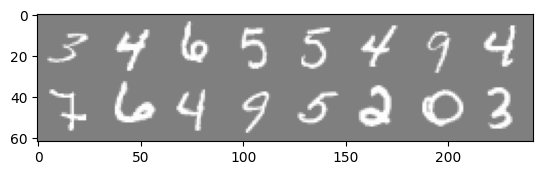

GroundTruth:  3     4     6     5     5     4     9     4     7     6     4     9     5     2     0     3    
Estimated Labels:  3     4     6     5     5     4     7     4     7     6     4     9     5     2     0     3    


In [ ]:
# Change the model to evaluation mode
model.eval()

# Initialize the total correct predictions to 0
correct = 0

test_loader = DataLoader(test_dataset,
                         shuffle=True,
                         batch_size=batch_size,
                         num_workers=2)

with torch.no_grad():
  for data in test_loader:
    images, labels = data[0].to(device), data[1].to(device)
    # Now, let's see what the network thinks these examples are
    outputs = model(images)
    _, predicted = torch.max(outputs.data, 1)
    correct += (predicted == labels).sum().item()

print('Accuracy of the model on test images: %d %%' % (100 * correct / len(test_loader.dataset)))

# Move the model back to the CPU
model = model.to('cpu')

# get some random training images
dataiter = iter(test_loader)
images, labels = next(dataiter)

# create grid of images
img_grid=torchvision.utils.make_grid(images)
img_grid.unnorm = unnormalize(img_grid)
imshow(img_grid.unnorm)
print('GroundTruth: ', ' '.join(f'{classes[labels[j]]:5s}' for j in range(images.shape[0])))

# # Now, let's see what the network thinks these examples are
output = model(images)
estimated_labels = torch.max(output, 1).indices
print('Estimated Labels: ', ' '.join(f'{classes[estimated_labels[j]]:5s}' for j in range(images.shape[0])))

## For Tabular Data (House Price Prediction)

In [ ]:
# Change the model to evaluation mode
model.eval()

test_loader = DataLoader(test_dataset,
                         shuffle=True,
                         batch_size=1,
                         num_workers=2)

# Retrieve the original test data
test_data  = pd.read_csv('data/test.csv')
test_ids = test_data['Id']
test_prediction = []

# this is for house price prediction from Kaggle data
# so no labels in the test set
with torch.no_grad():
  # iterate over the DataLoader for training data
  for i, data in enumerate(test_loader,0):
    inputs = data.to(device)
    # Now, let's see what the network thinks these examples are
    prediction = model(inputs)
    unnormalized = 10**prediction
    test_prediction.append(unnormalized.item())
#    print(f'{i} : {unnormalized.item():,.2f}')

# convert test_ids to a dataframe
submission = pd.DataFrame(test_ids)
submission['SalePrice'] = test_prediction

print(submission.shape)
submission.to_csv('data/predictions.csv',index=False)

(1459, 2)


# Utilities

## Splitting the Training Data into Training and Validation

In [ ]:
# Simple way to split an input vector x
def split( x, y, ratio=0.8):
  # Shuffles the indices
  N = len(x)
  assert N == len(y) and y.shape == (N,1) and x.shape == (N,1)
  idx = np.arange(N)
  np.random.shuffle(idx)

  # Uses first 80 random indices for train
  train_idx = idx[:int(N*ratio)]
  # Uses the remaining indices for validation
  val_idx = idx[int(N*ratio):]
  # Generates train and validation sets
  x_train, y_train = x[train_idx], y[train_idx]
  x_val, y_val = x[val_idx], y[val_idx]

  return x_train, y_train, x_val, y_val

true_b = 1
true_w = 2
N = 100

# Data Generation
np.random.seed(42)
x = np.random.rand(N, 1)
epsilon = (.1 * np.random.randn(N, 1))
y = true_b + true_w * x + epsilon

x_train, y_train, x_val, y_val = split(x,y)
print(f'Shape x_train: {x_train.shape}')
print(f'Shape y_train: {y_train.shape}')
print(f'Shape x_val: {x_val.shape}')
print(f'Shape y_val: {y_val.shape}')

In [ ]:
import os

def mkdir_if_not_exists(directory_path):
    if not os.path.exists(directory_path):
        try:
            os.makedirs(directory_path)
            print(f"Directory {directory_path} created ")
        except Exception as e:
            print(f"Error occurred while creating directory {directory_path}. Error: {str(e)}")
    else:
        print(f"Directory {directory_path} already exists")

# Testing the function
mkdir_if_not_exists('test')

Directory path/to/your/directory created 
